In [7]:
import matplotlib.pyplot as plt
import netCDF4 as nc
import numpy as np
from matplotlib import reload
import xarray as xr
from xarray import Dataset as ds
import sys
sys.path.append('..')
sys.path.append('../maps_signals')
import map_fxn as mf
import cluster_fxn as cf
%matplotlib inline
bath = '/results/nowcast-sys/NEMO-forcing/grid/mesh_mask_SalishSea2.nc'
grid = mf.import_bathy(bath)
fmask = (grid.fmask[0,0,:,:])
import colorsys
import scipy.io as sio
import cmocean 

In [8]:
reload(mf)
reload(cf)

<module 'cluster_fxn' from '../maps_signals/cluster_fxn.py'>

In [9]:
## xkcd colours
# https://xkcd.com/color/rgb.txt


colors = ["#000000", "#FFFF00", "#1CE6FF", "#FF34FF", "#FF4A46", "#008941", "#006FA6", "#A30059",
        "#FFDBE5", "#7A4900", "#0000A6", "#63FFAC", "#B79762", "#004D43", "#8FB0FF", "#997D87",
        "#5A0007", "#809693", "#FEFFE6", "#1B4400", "#4FC601", "#3B5DFF", "#4A3B53", "#FF2F80",
        "#61615A", "#BA0900", "#6B7900", "#00C2A0", "#FFAA92", "#FF90C9", "#B903AA", "#D16100",
        "#DDEFFF", "#000035", "#7B4F4B", "#A1C299", "#300018", "#0AA6D8", "#013349", "#00846F",
        "#372101", "#FFB500", "#C2FFED", "#A079BF", "#CC0744", "#C0B9B2", "#C2FF99", "#001E09",
        "#00489C", "#6F0062", "#0CBD66", "#EEC3FF", "#456D75", "#B77B68", "#7A87A1", "#788D66",
        "#885578", "#FAD09F", "#FF8A9A", "#D157A0", "#BEC459", "#456648", "#0086ED", "#886F4C",
        
        "#34362D", "#B4A8BD", "#00A6AA", "#452C2C", "#636375", "#A3C8C9", "#FF913F", "#938A81",
        "#575329", "#00FECF", "#B05B6F", "#8CD0FF", "#3B9700", "#04F757", "#C8A1A1", "#1E6E00",
        "#7900D7", "#A77500", "#6367A9", "#A05837", "#6B002C", "#772600", "#D790FF", "#9B9700",
        "#549E79", "#FFF69F", "#201625", "#72418F", "#BC23FF", "#99ADC0", "#3A2465", "#922329",
        "#5B4534", "#FDE8DC", "#404E55", "#0089A3", "#CB7E98", "#A4E804", "#324E72", "#6A3A4C",
        "#83AB58", "#001C1E", "#D1F7CE", "#004B28", "#C8D0F6", "#A3A489", "#806C66", "#222800",
        "#BF5650", "#E83000", "#66796D", "#DA007C", "#FF1A59", "#8ADBB4", "#1E0200", "#5B4E51",
        "#C895C5", "#320033", "#FF6832", "#66E1D3", "#CFCDAC", "#D0AC94", "#7ED379", "#012C58",
        
        "#7A7BFF", "#D68E01", "#353339", "#78AFA1", "#FEB2C6", "#75797C", "#837393", "#943A4D",
        "#B5F4FF", "#D2DCD5", "#9556BD", "#6A714A", "#001325", "#02525F", "#0AA3F7", "#E98176",
        "#DBD5DD", "#5EBCD1", "#3D4F44", "#7E6405", "#02684E", "#962B75", "#8D8546", "#9695C5",
        "#E773CE", "#D86A78", "#3E89BE", "#CA834E", "#518A87", "#5B113C", "#55813B", "#E704C4",
        "#00005F", "#A97399", "#4B8160", "#59738A", "#FF5DA7", "#F7C9BF", "#643127", "#513A01",
        "#6B94AA", "#51A058", "#A45B02", "#1D1702", "#E20027", "#E7AB63", "#4C6001", "#9C6966",
        "#64547B", "#97979E", "#006A66", "#391406", "#F4D749", "#0045D2", "#006C31", "#DDB6D0",
        "#7C6571", "#9FB2A4", "#00D891", "#15A08A", "#BC65E9", "#FFFFFE", "#C6DC99", "#203B3C",

        "#671190", "#6B3A64", "#F5E1FF", "#FFA0F2", "#CCAA35", "#374527", "#8BB400", "#797868",
        "#C6005A", "#3B000A", "#C86240", "#29607C", "#402334", "#7D5A44", "#CCB87C", "#B88183",
        "#AA5199", "#B5D6C3", "#A38469", "#9F94F0", "#A74571", "#B894A6", "#71BB8C", "#00B433",
        "#789EC9", "#6D80BA", "#953F00", "#5EFF03", "#E4FFFC", "#1BE177", "#BCB1E5", "#76912F",
        "#003109", "#0060CD", "#D20096", "#895563", "#29201D", "#5B3213", "#A76F42", "#89412E",
        "#1A3A2A", "#494B5A", "#A88C85", "#F4ABAA", "#A3F3AB", "#00C6C8", "#EA8B66", "#958A9F",
        "#BDC9D2", "#9FA064", "#BE4700", "#658188", "#83A485", "#453C23", "#47675D", "#3A3F00",
        "#061203", "#DFFB71", "#868E7E", "#98D058", "#6C8F7D", "#D7BFC2", "#3C3E6E", "#D83D66",
        
        "#2F5D9B", "#6C5E46", "#D25B88", "#5B656C", "#00B57F", "#545C46", "#866097", "#365D25",
        "#252F99", "#00CCFF", "#674E60", "#FC009C", "#92896B"]


In [10]:
w = cmocean.cm.phase((range(0, 100)))
#print(w)
print(w[99,:])

[ 0.73376055  0.27554128  0.91502     1.        ]


[[  1   1   1 ...,   1   1   1]
 [  1   1   1 ...,   2   2   2]
 [  3   3   3 ...,   1   1   1]
 ..., 
 [ 98  98  98 ...,  38  91   4]
 [ 99  99  99 ...,  40  92   6]
 [100 100 100 ...,  42  93   8]]
[1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2

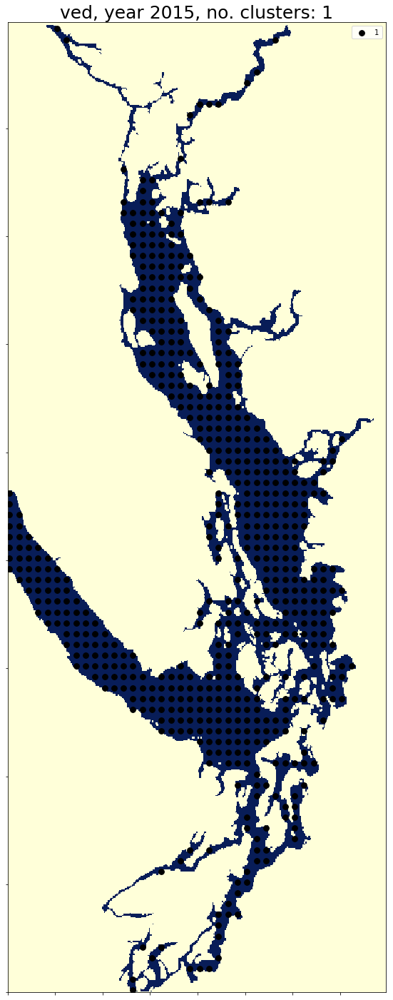

1
#000000
2
#FFFF00


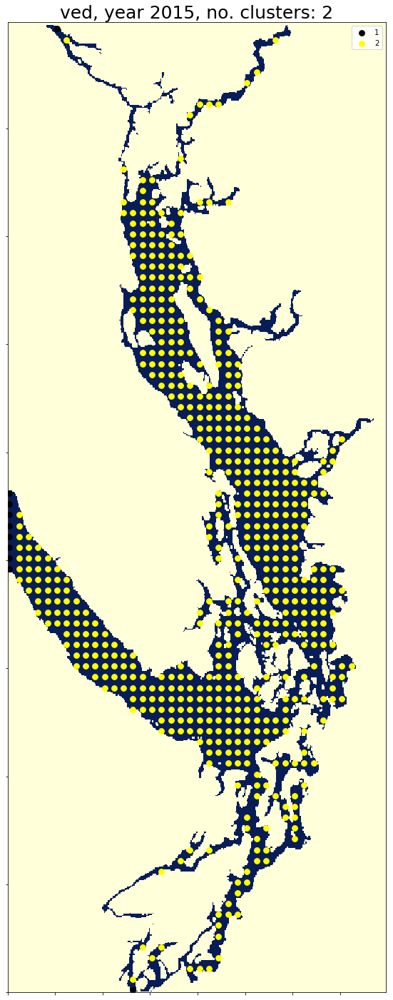

1
#000000
2
#FFFF00
3
#1CE6FF


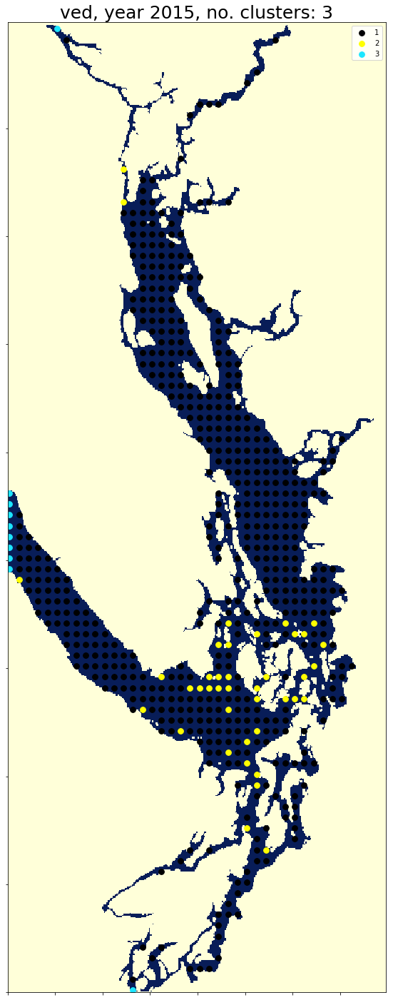

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF


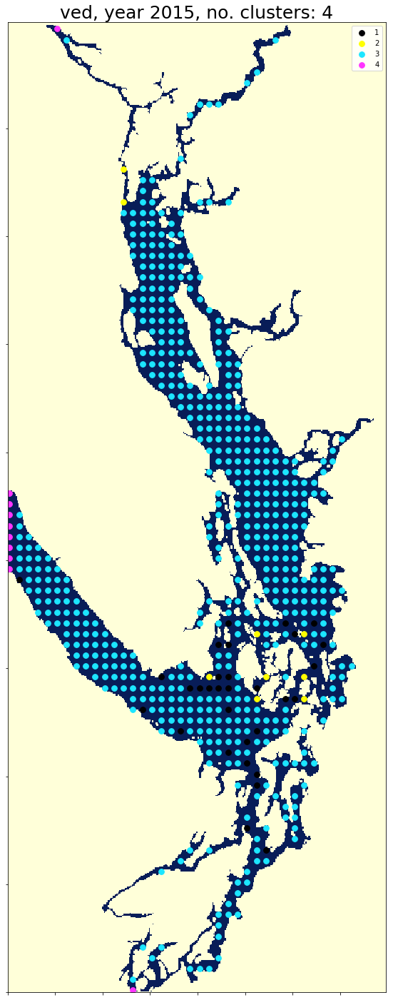

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46


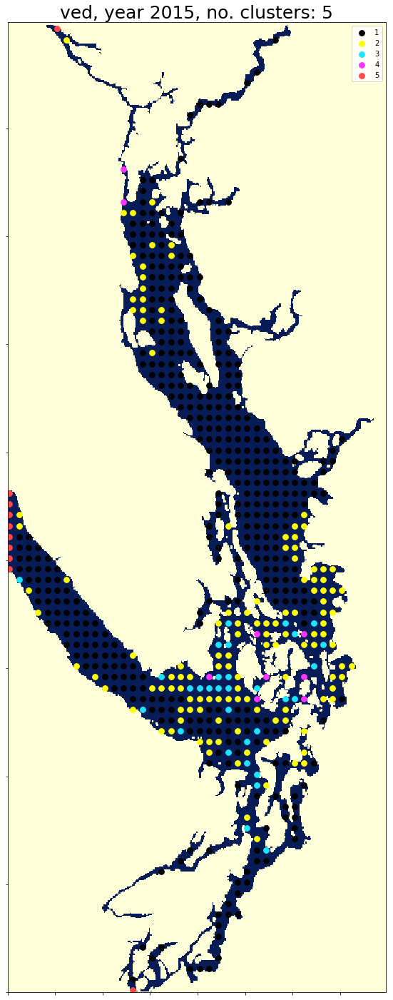

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941


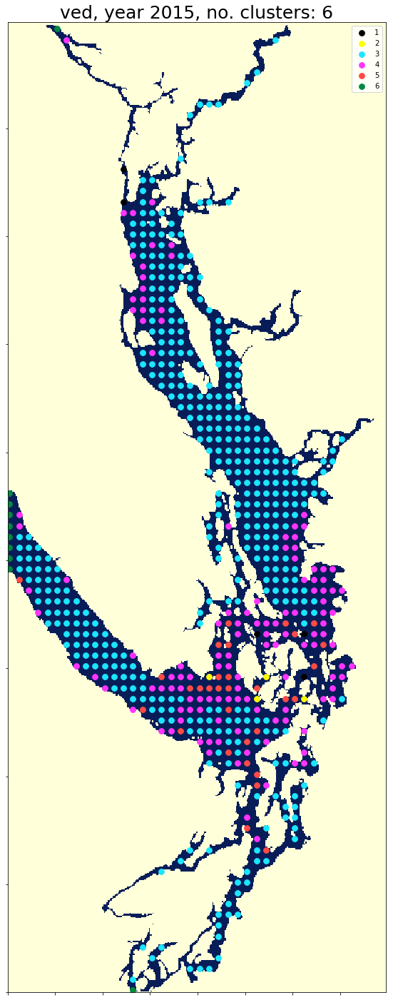

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6


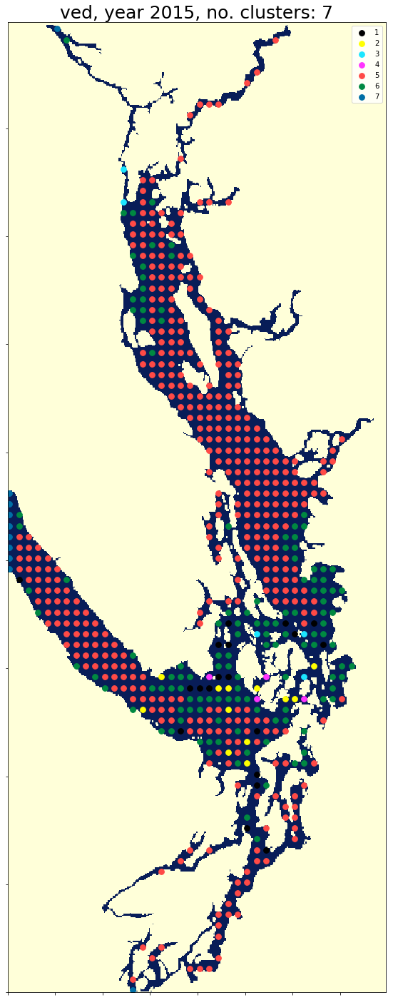

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059


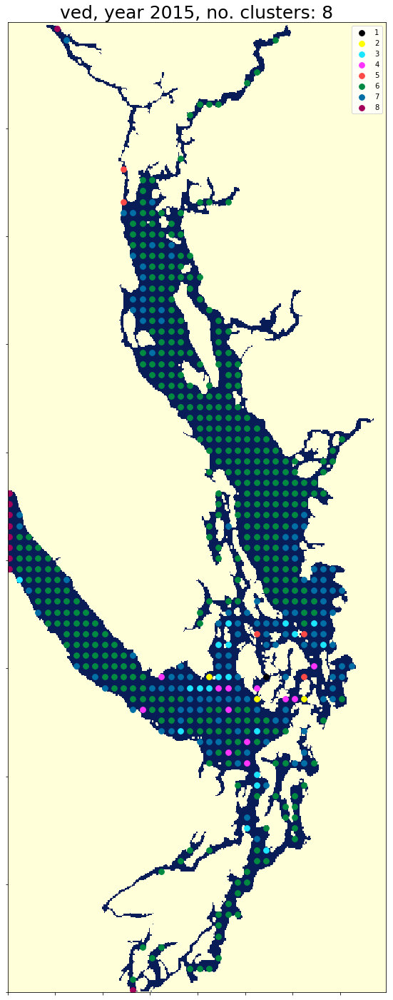

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5


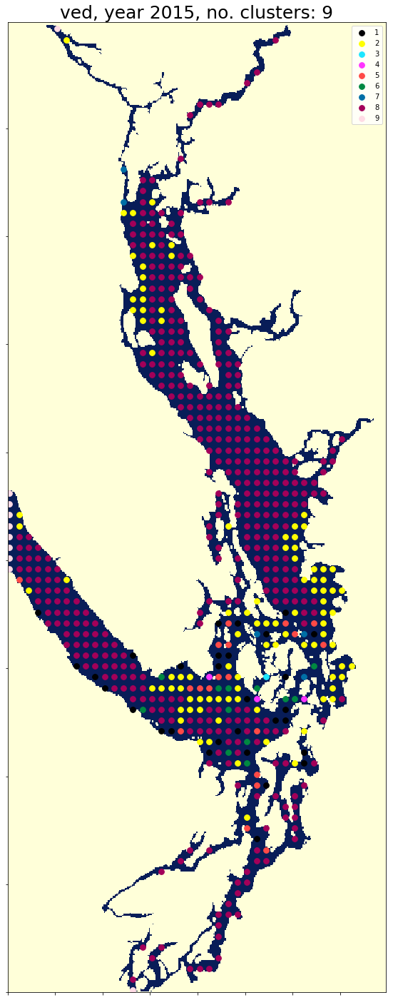

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900


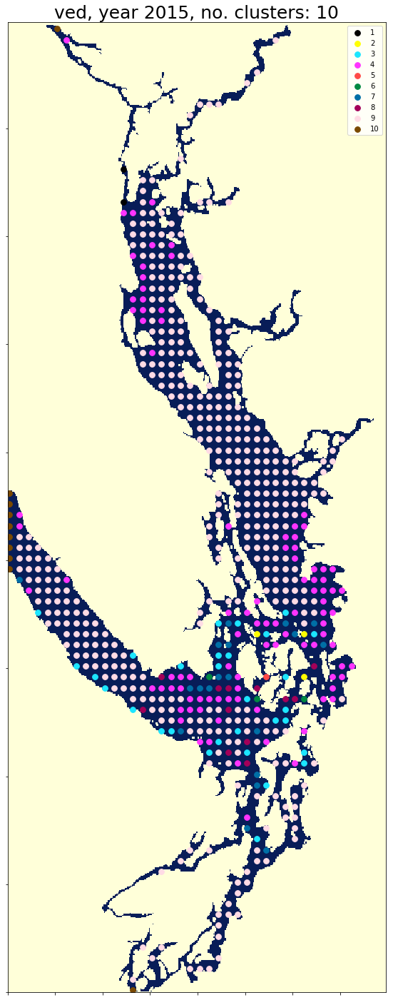

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6


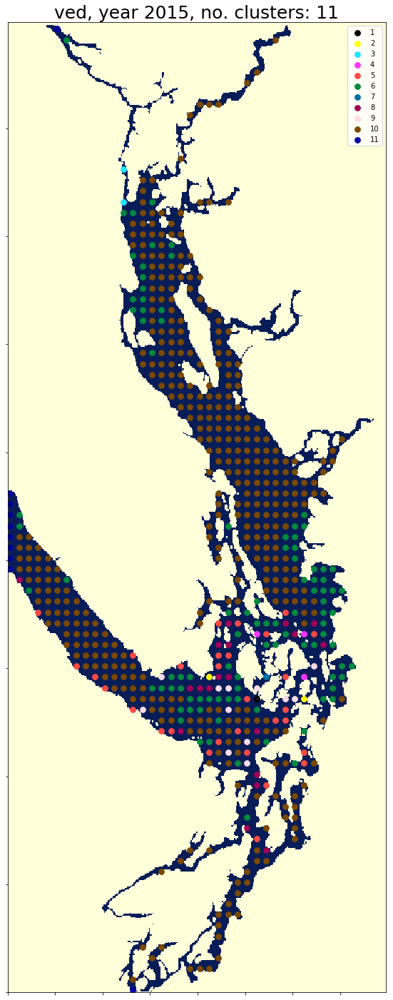

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC


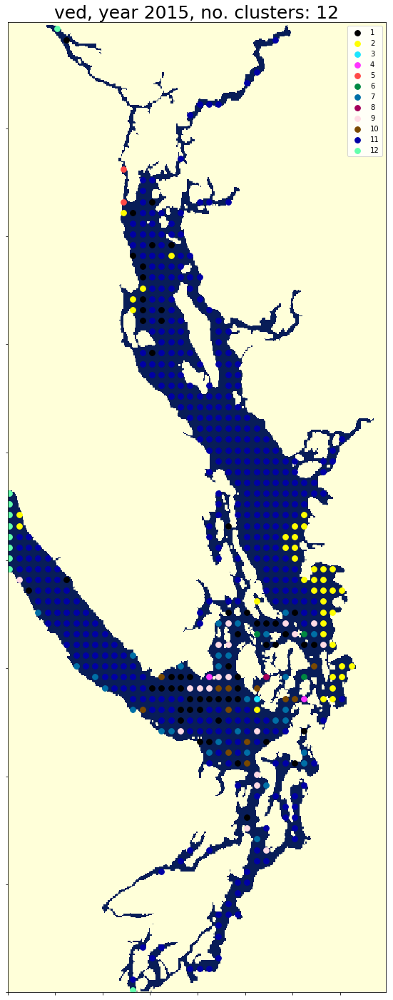

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762


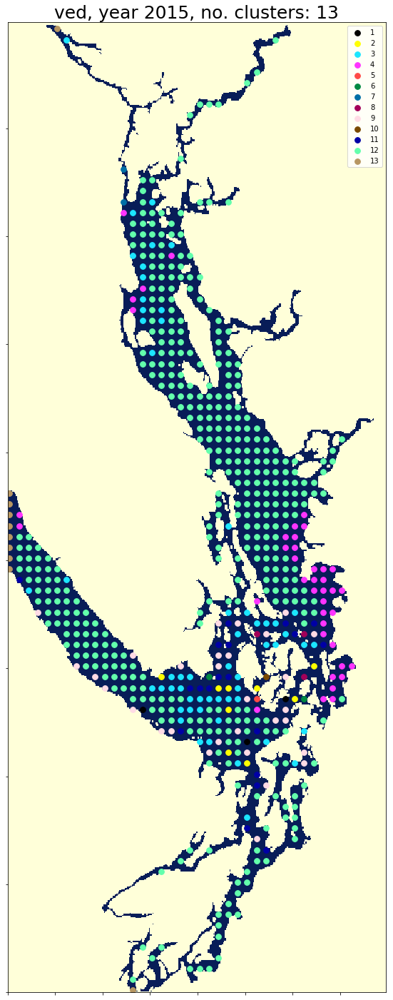

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43


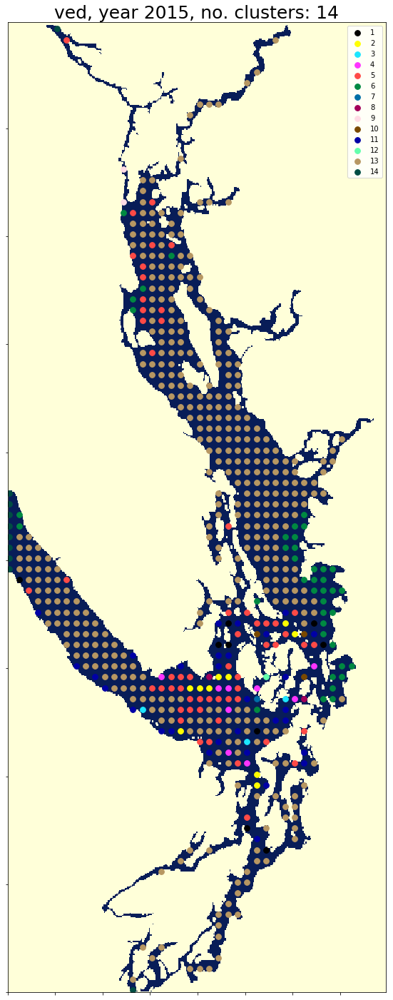

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF


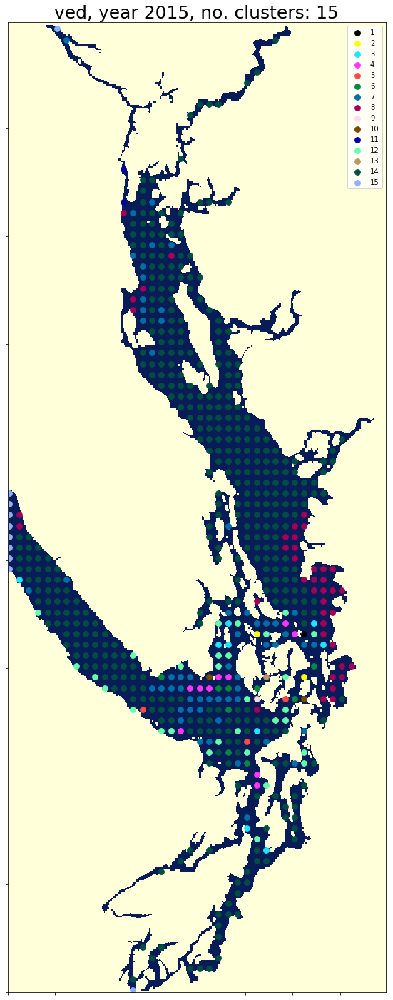

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87


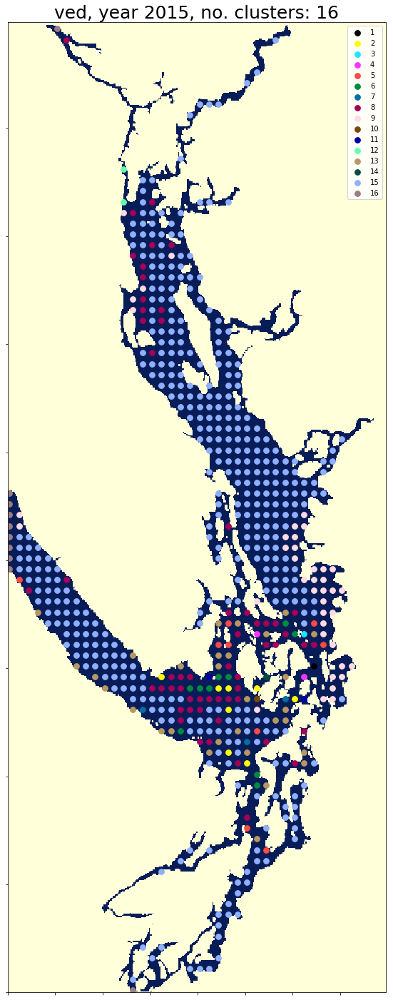

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007


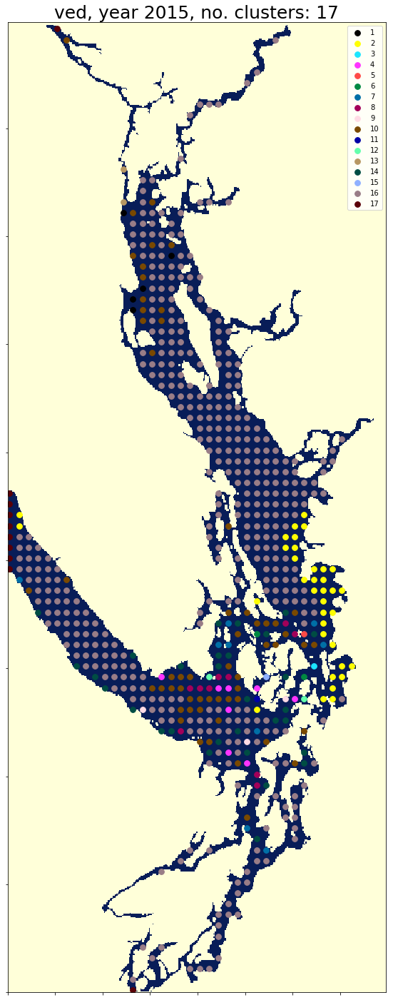

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693


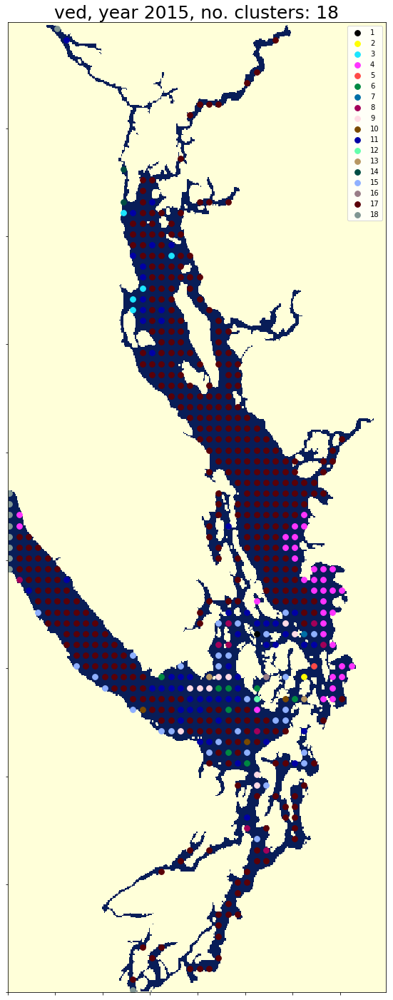

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6


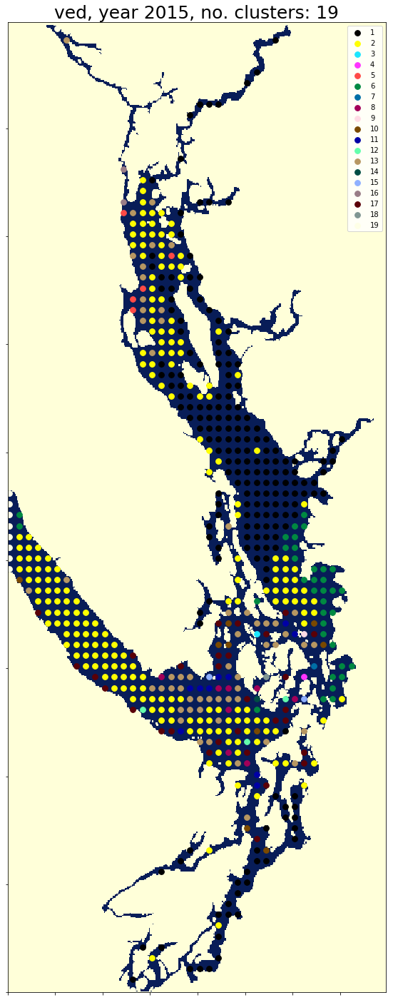

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400


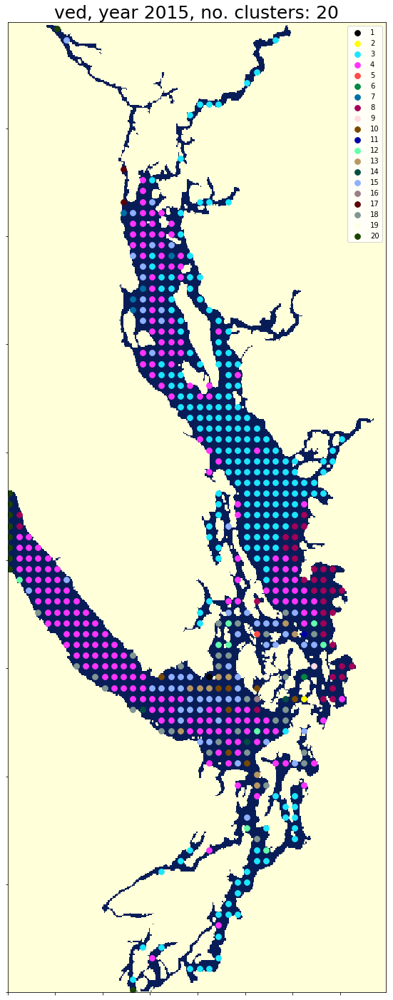

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601


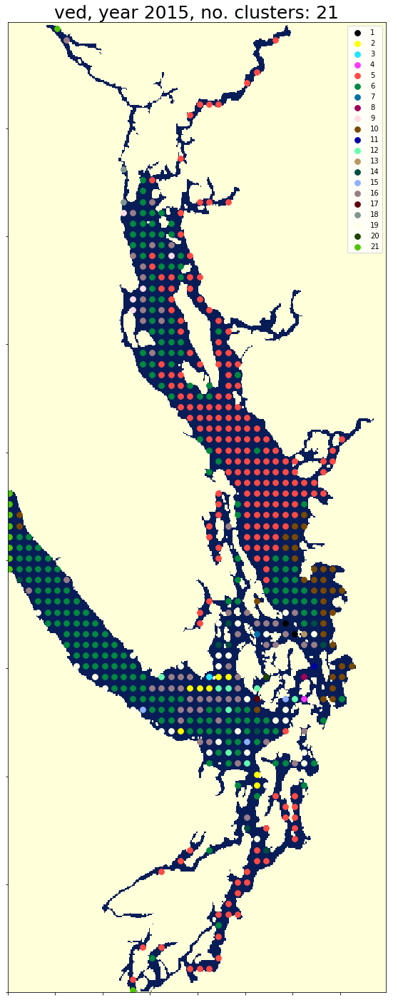

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF


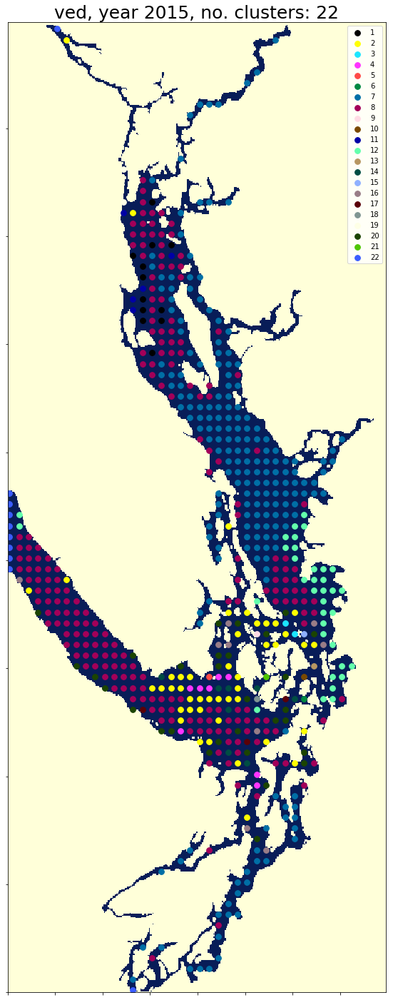

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53


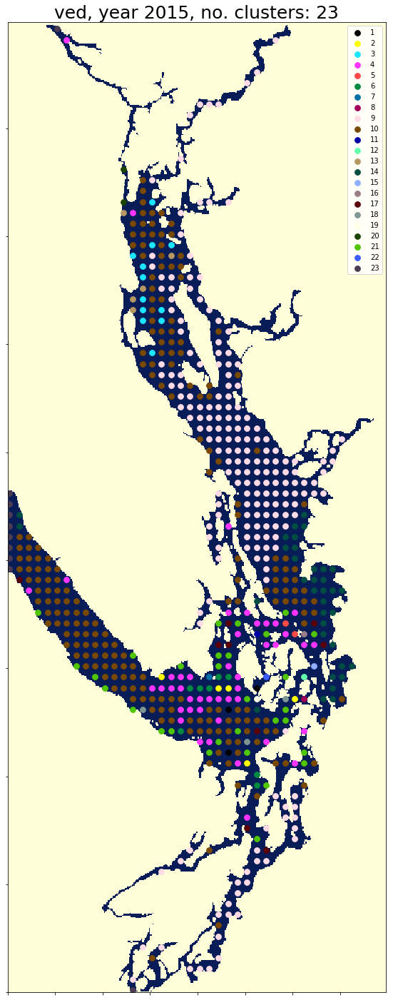

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80


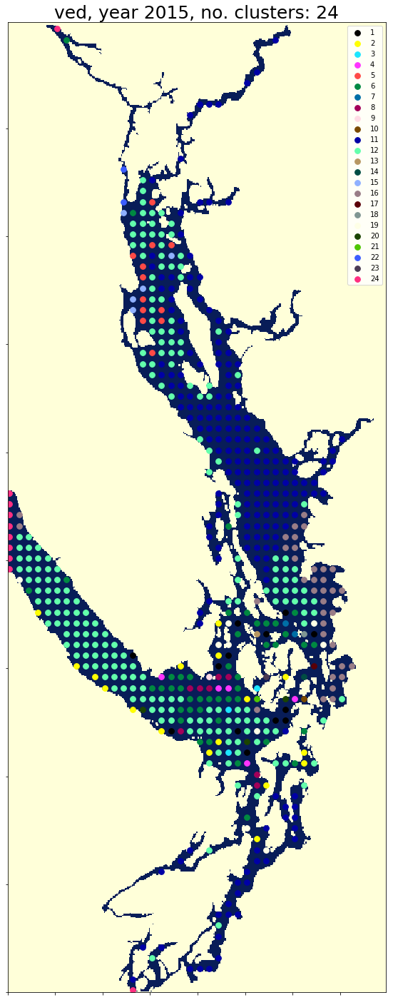

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A


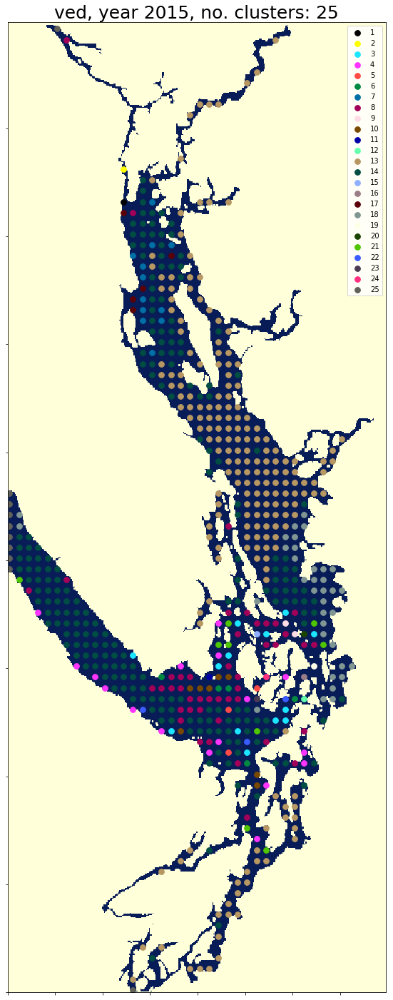

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900


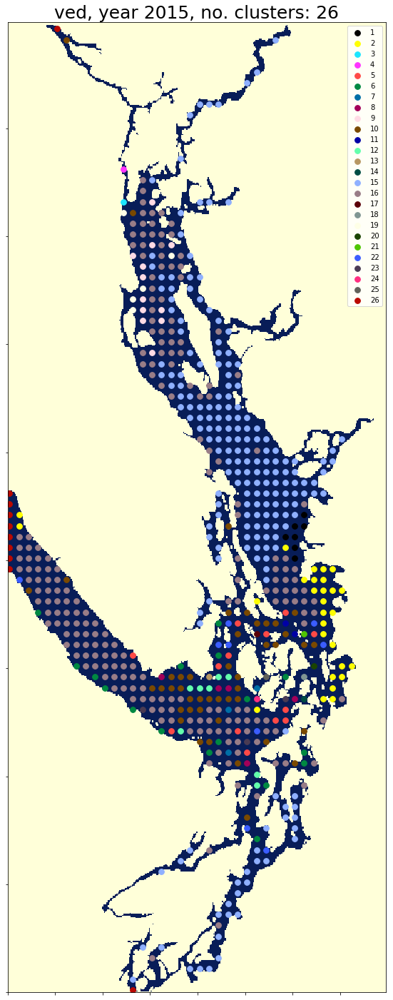

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900


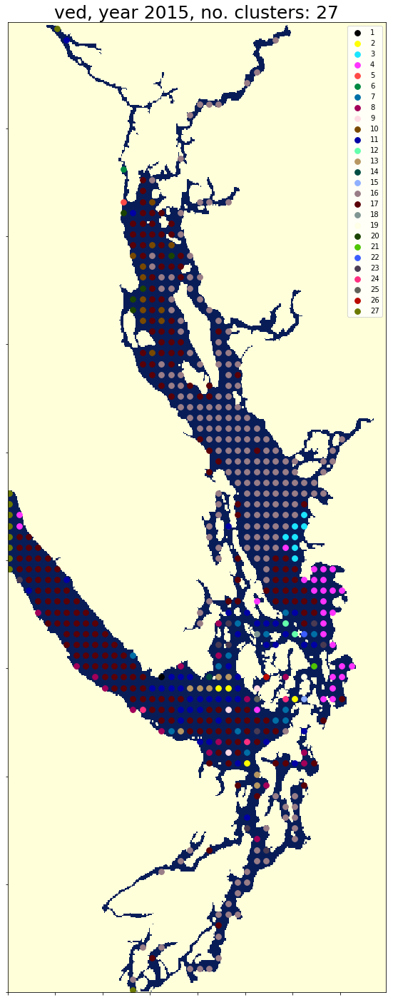

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0


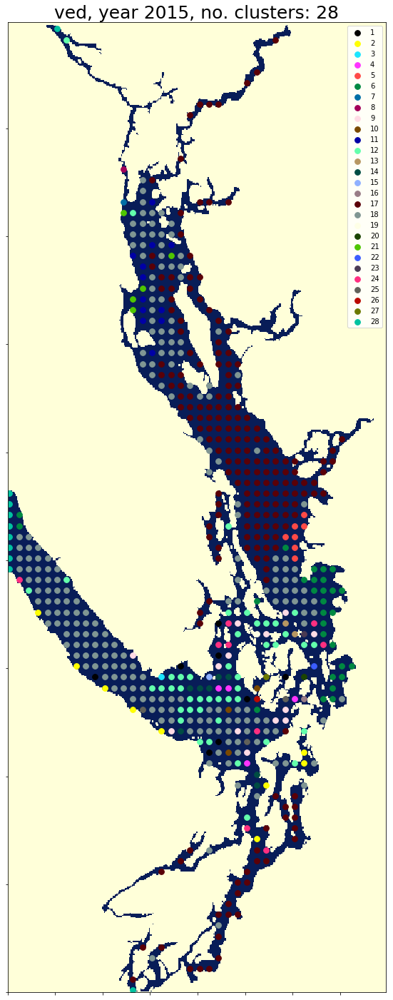

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92


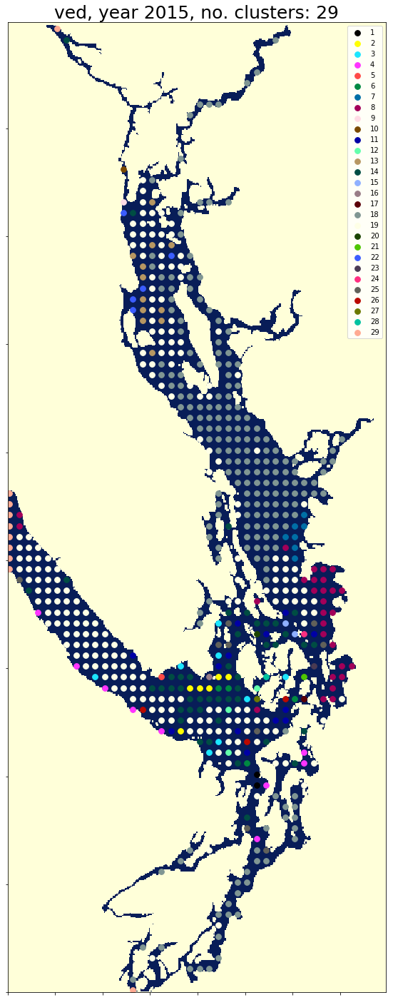

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9


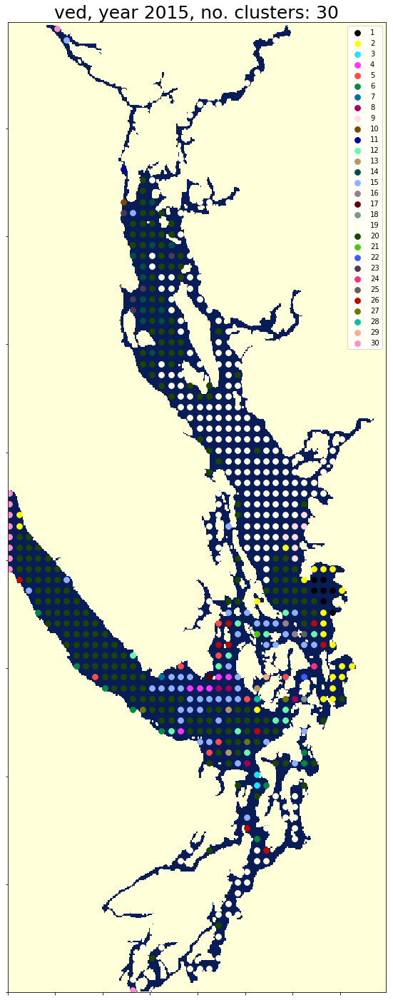

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA


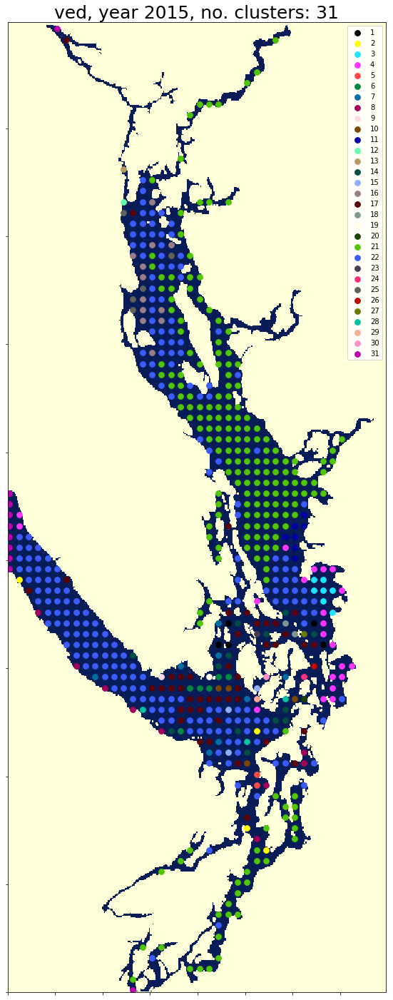

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100


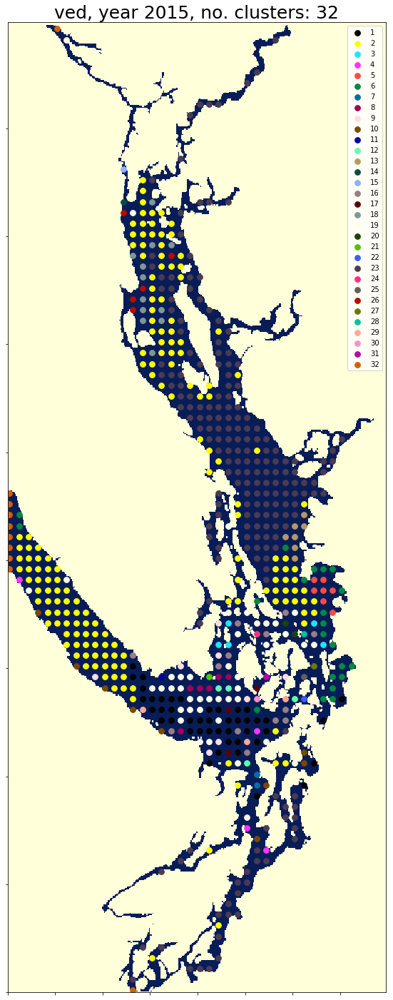

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF


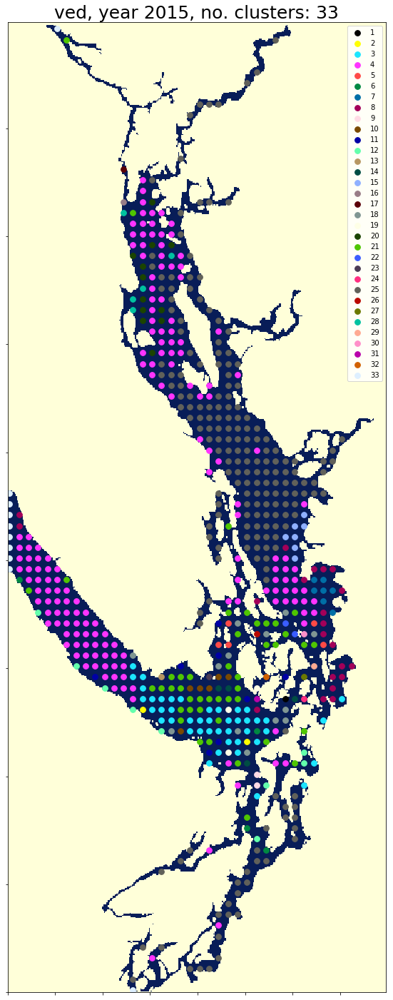

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035


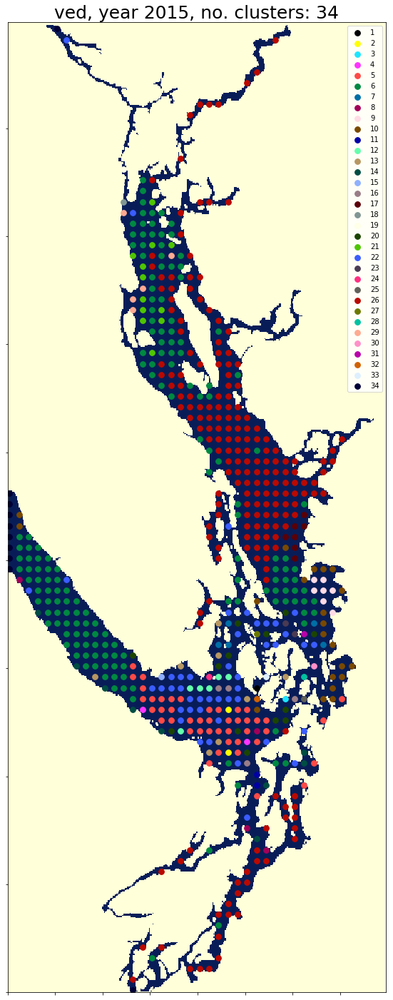

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B


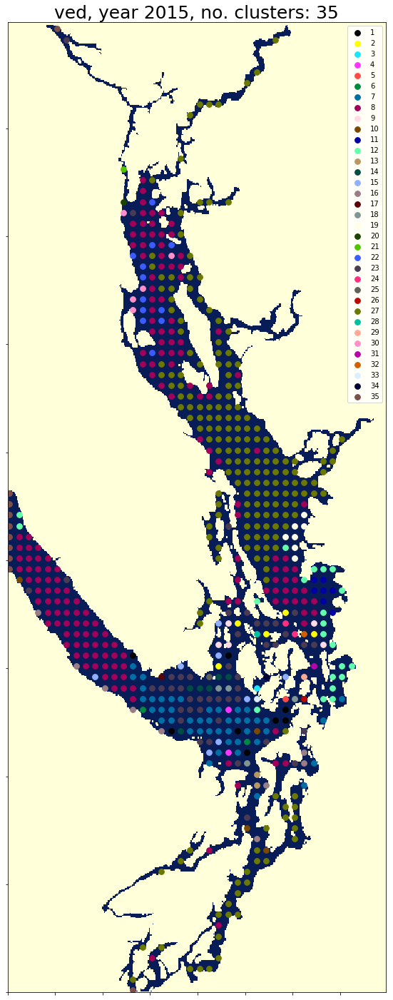

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299


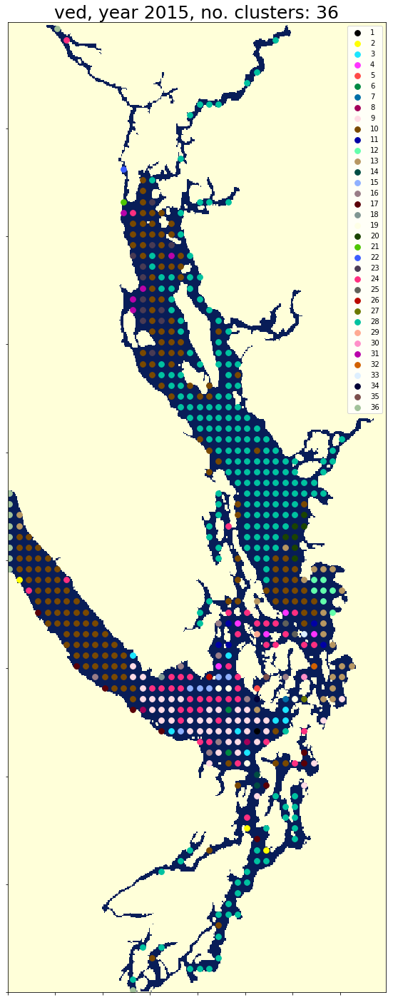

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018


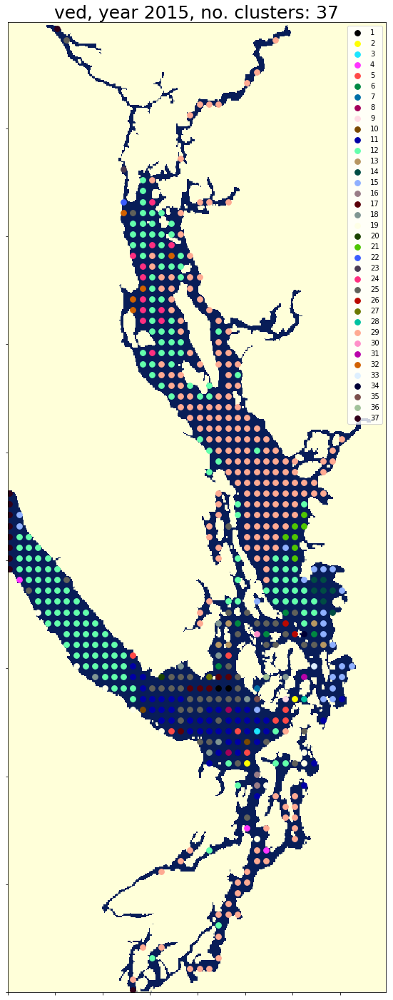

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8


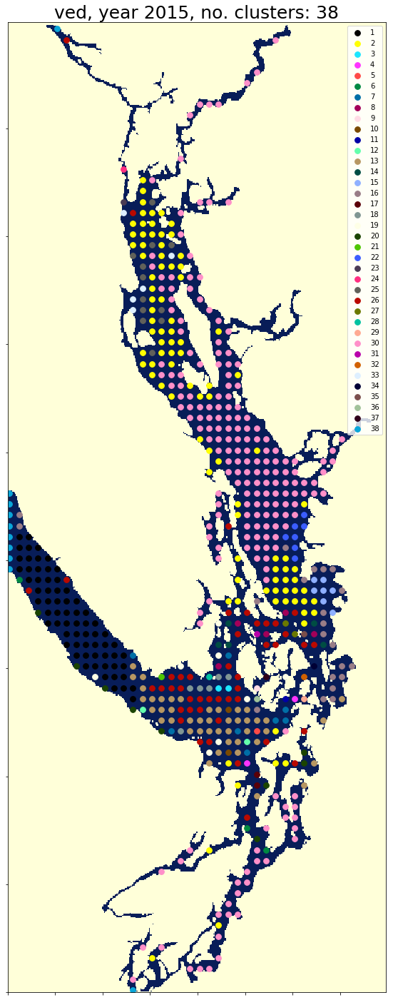

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349


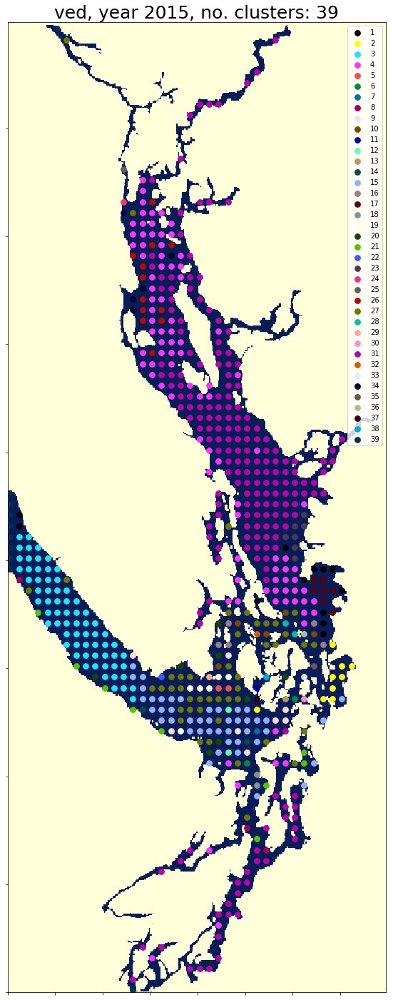

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F


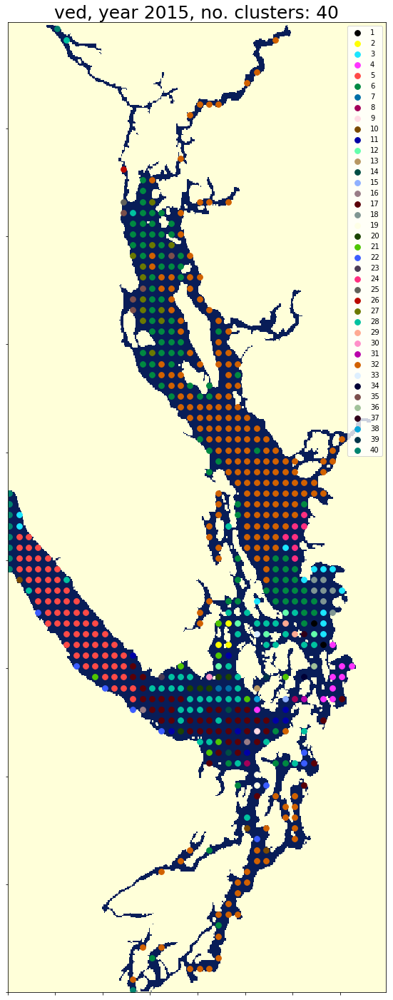

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101


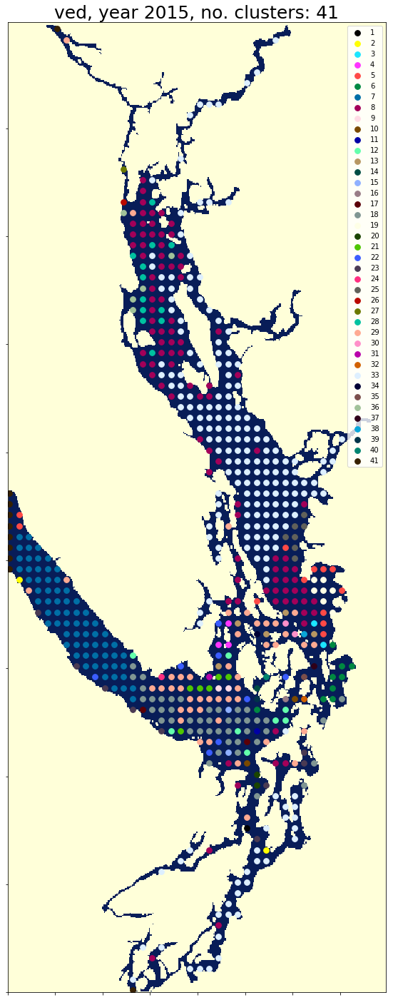

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500


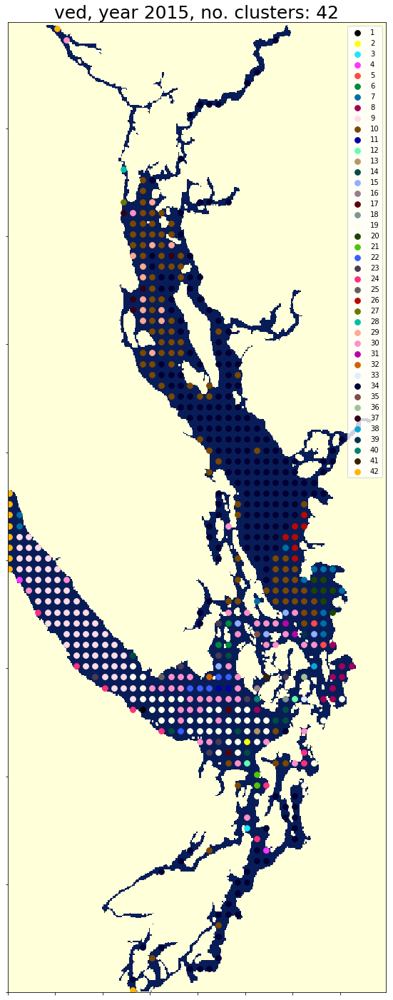

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED


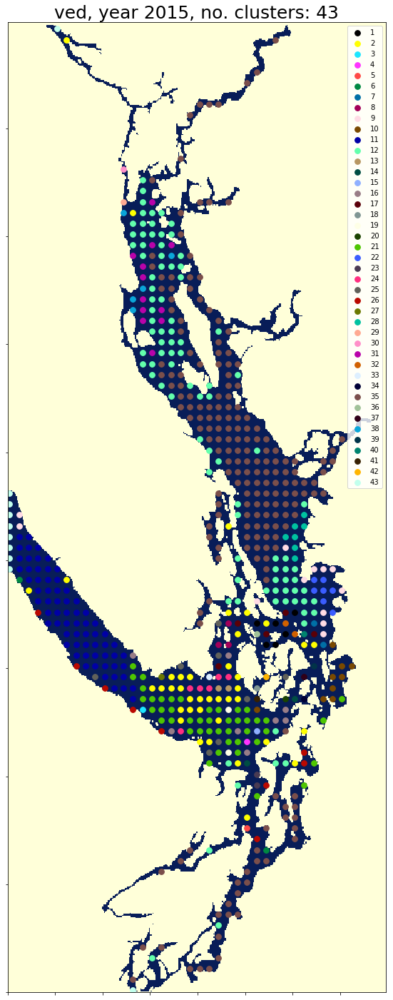

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF


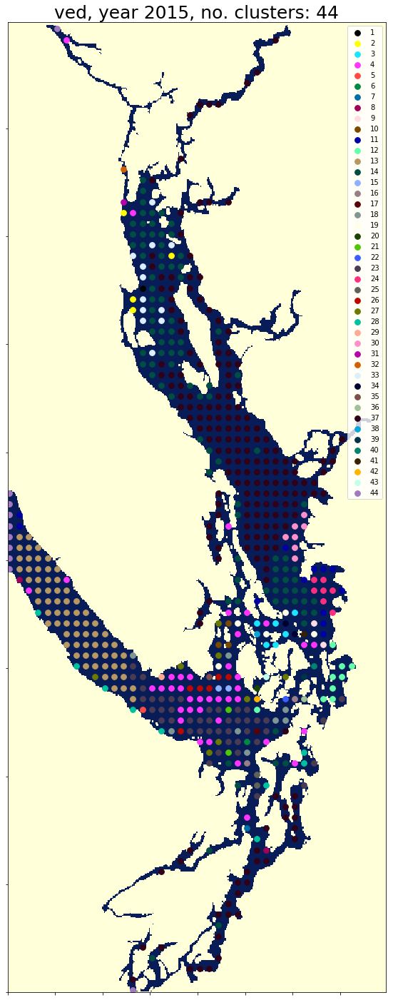

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744


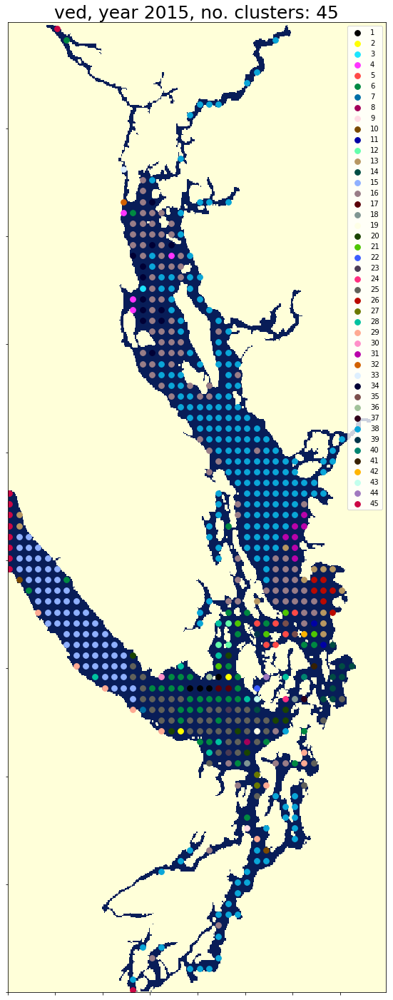

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2


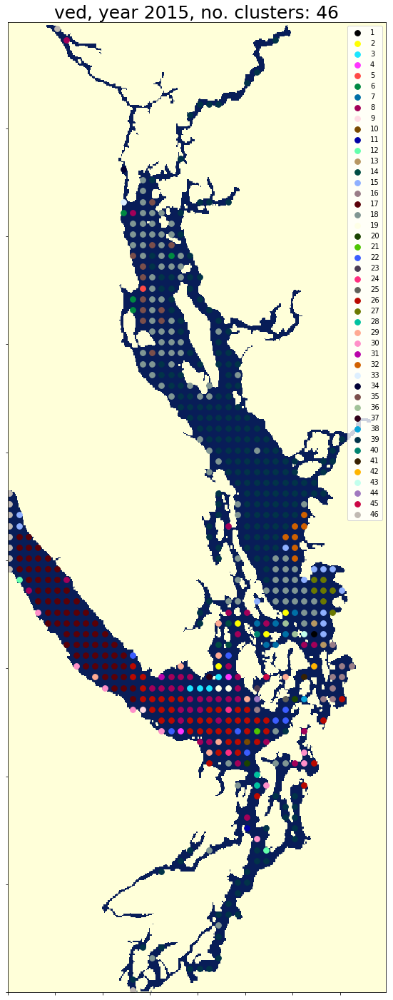

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99


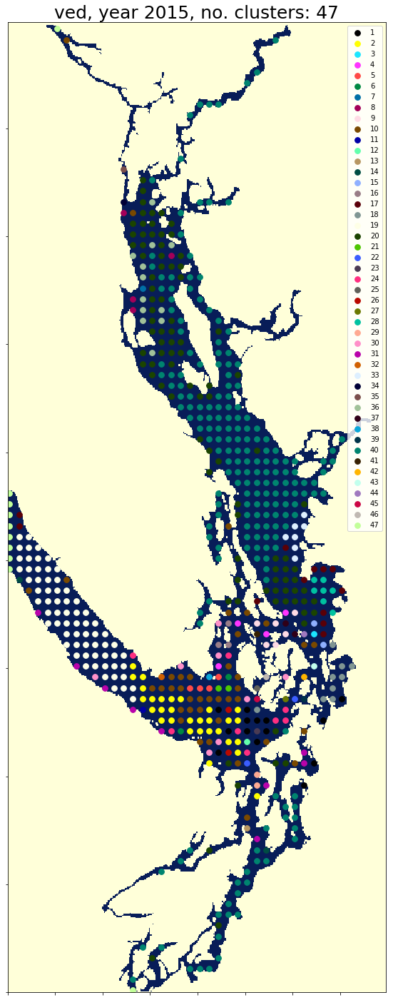

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09


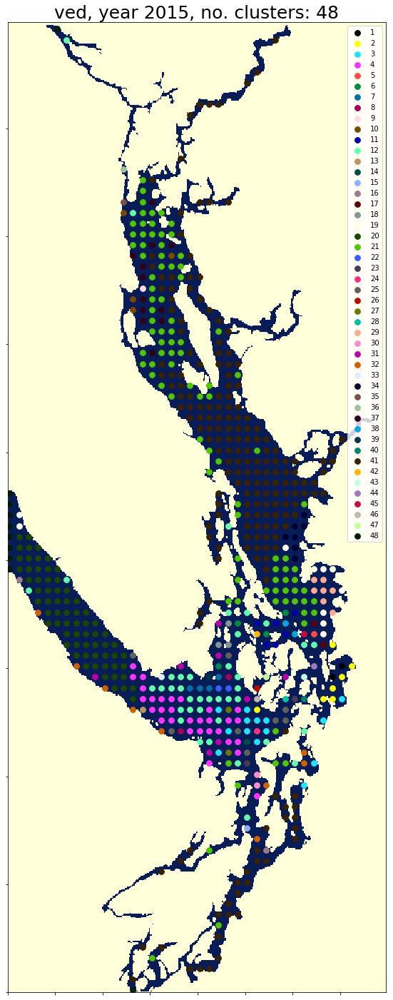

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C


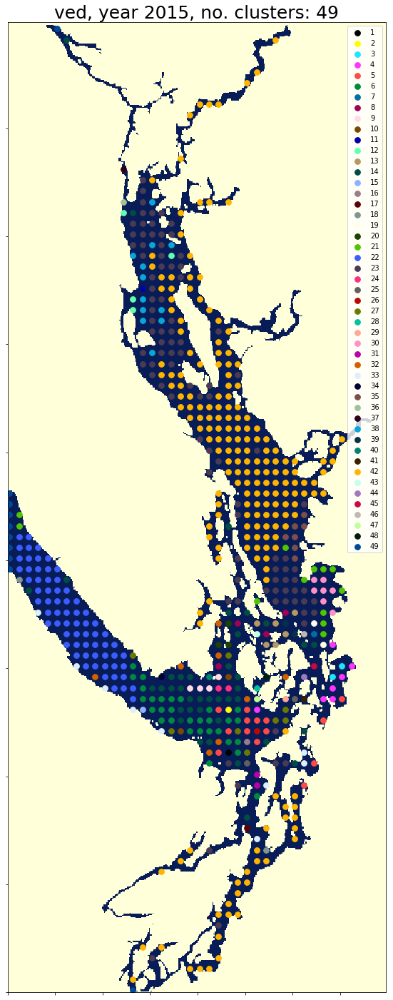

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062


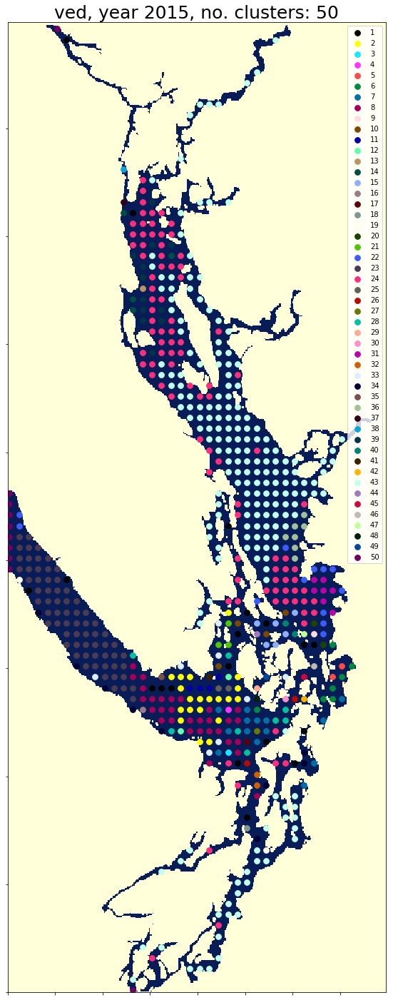

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66


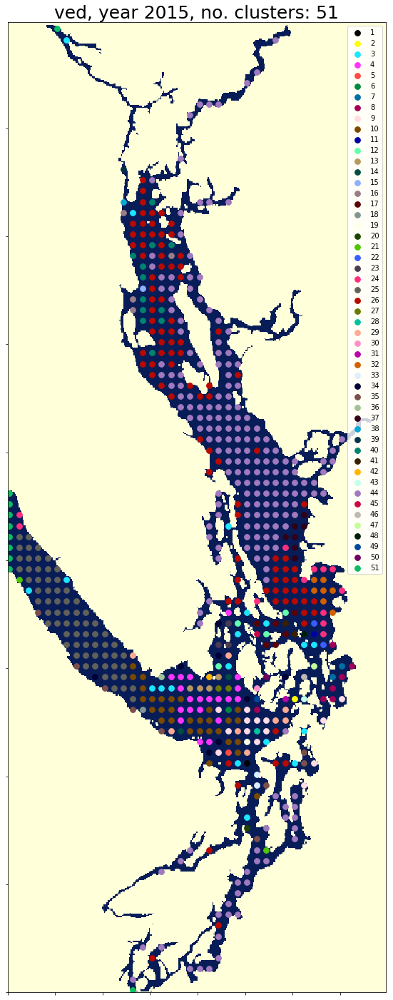

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF


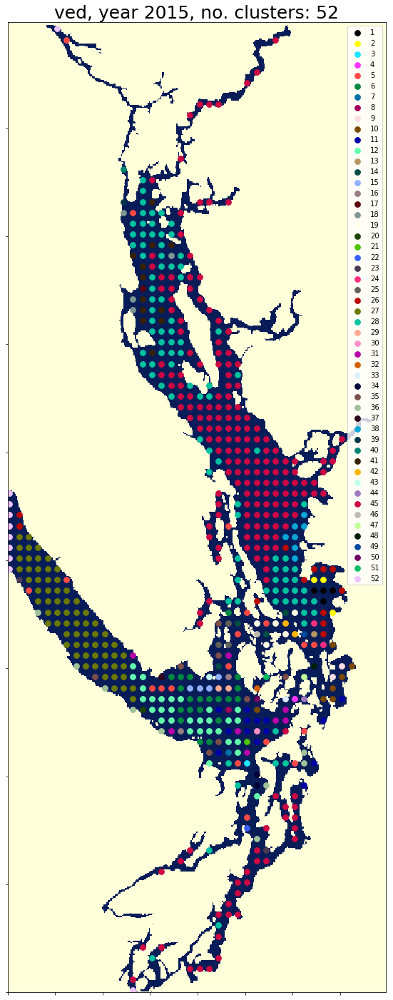

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75


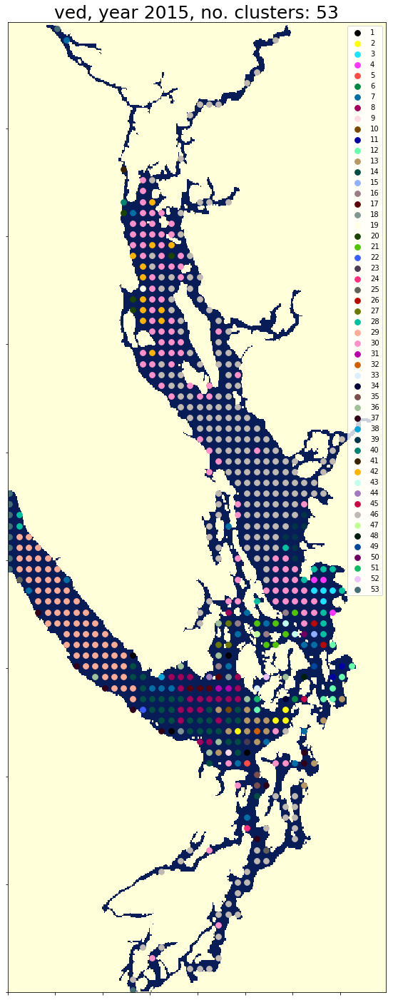

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68


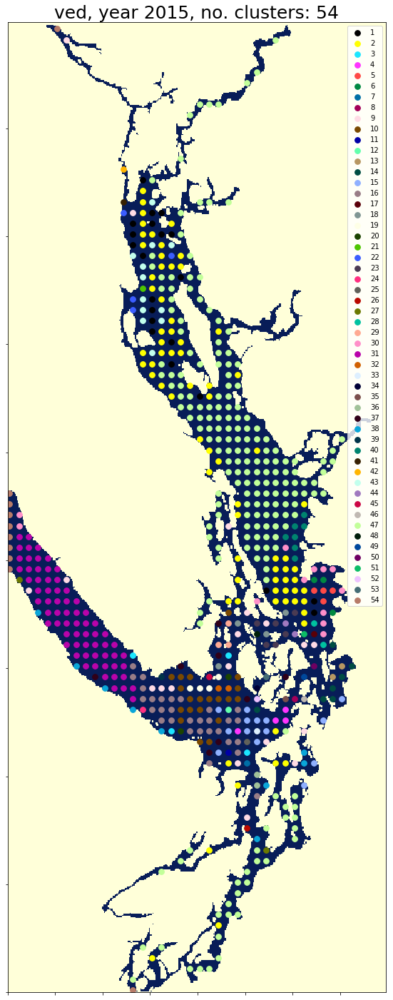

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1


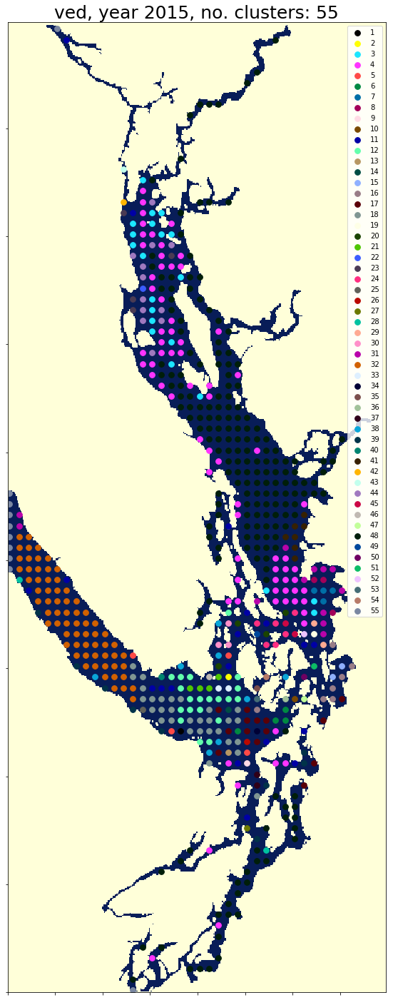

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66


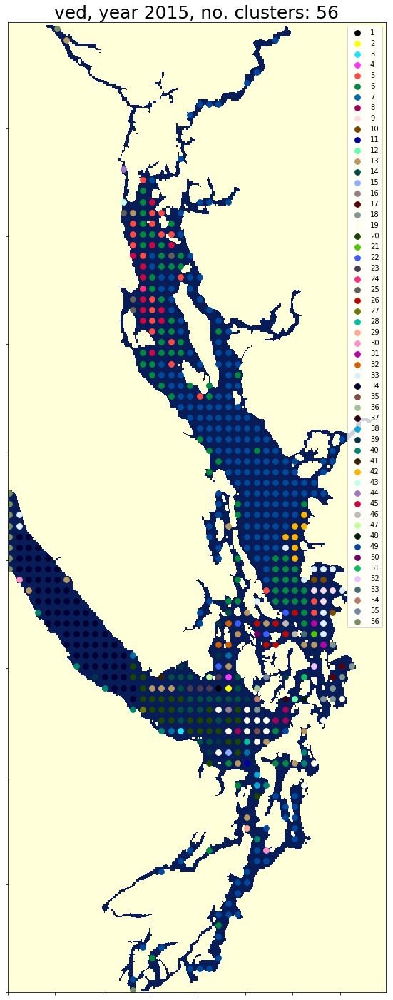

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578


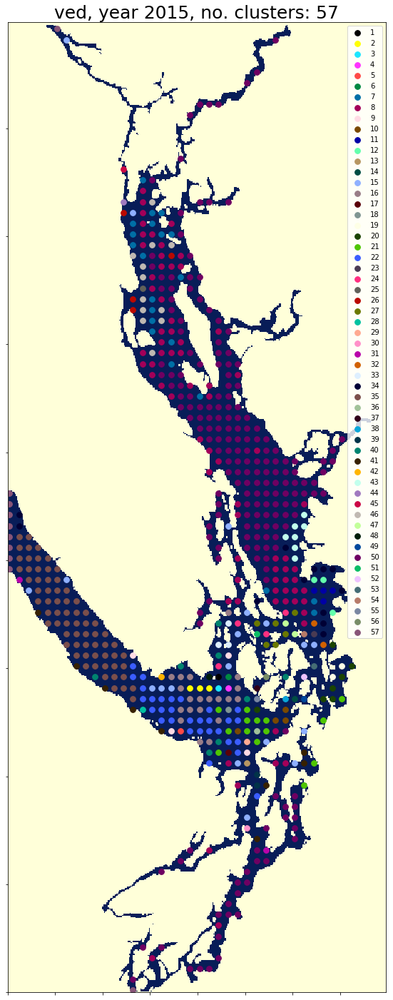

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F


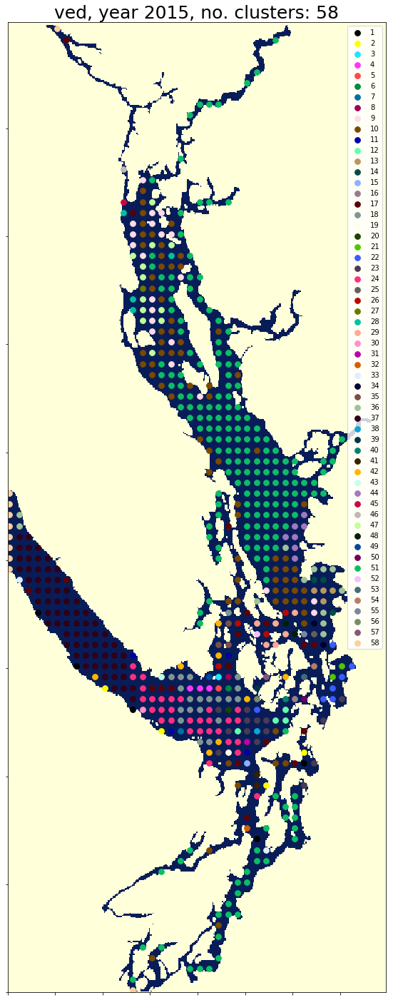

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A


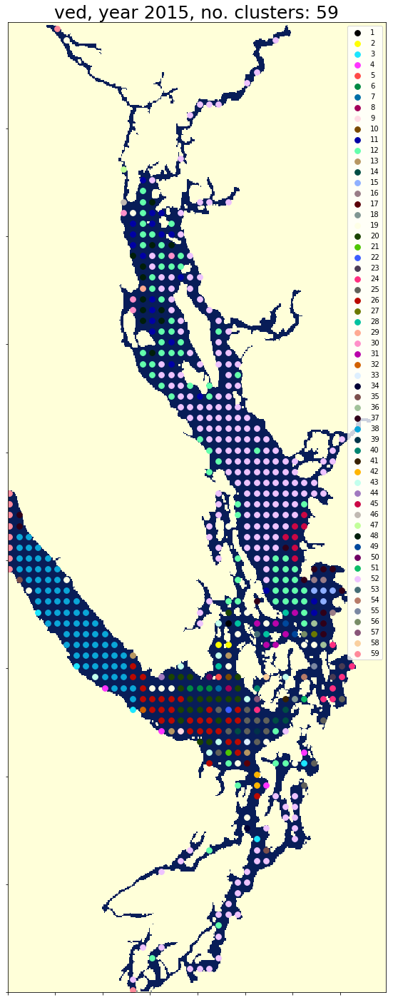

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0


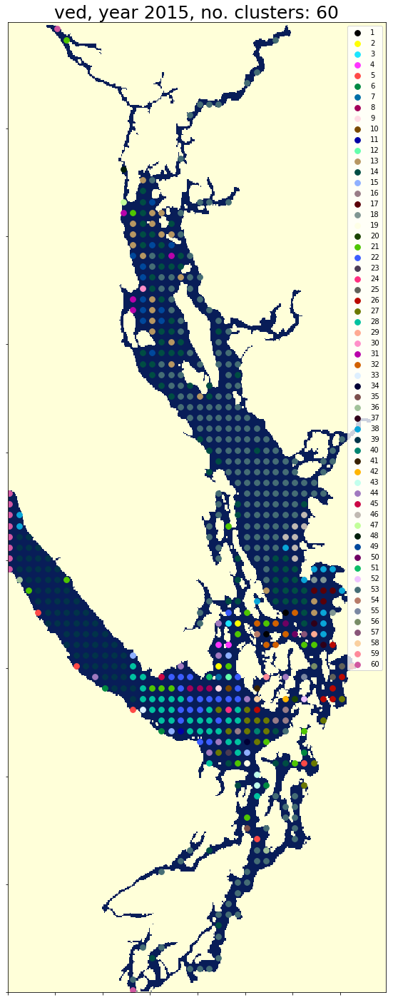

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0
61
#BEC459


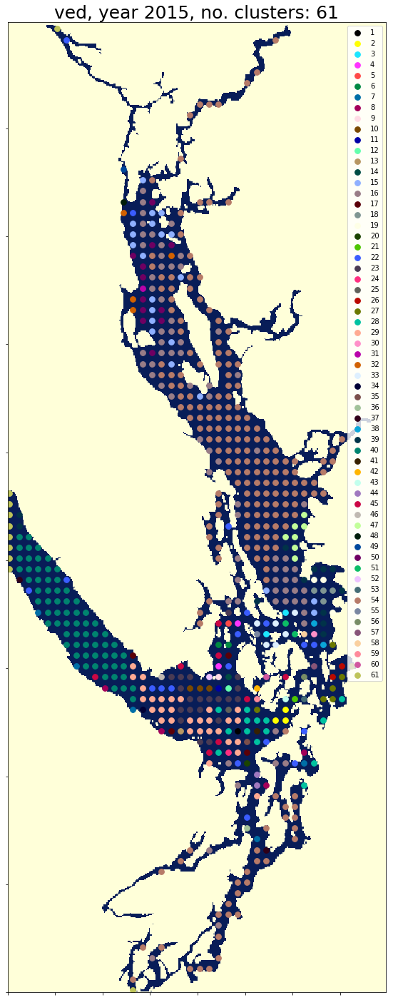

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0
61
#BEC459
62
#456648


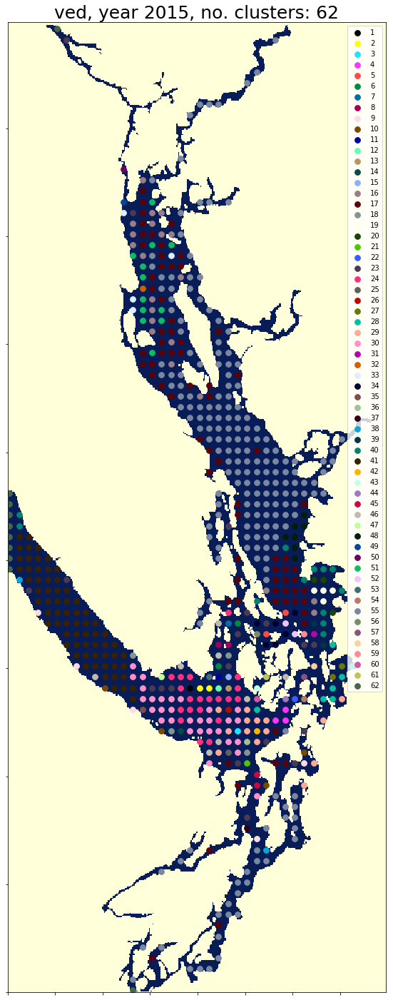

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0
61
#BEC459
62
#456648
63
#0086ED


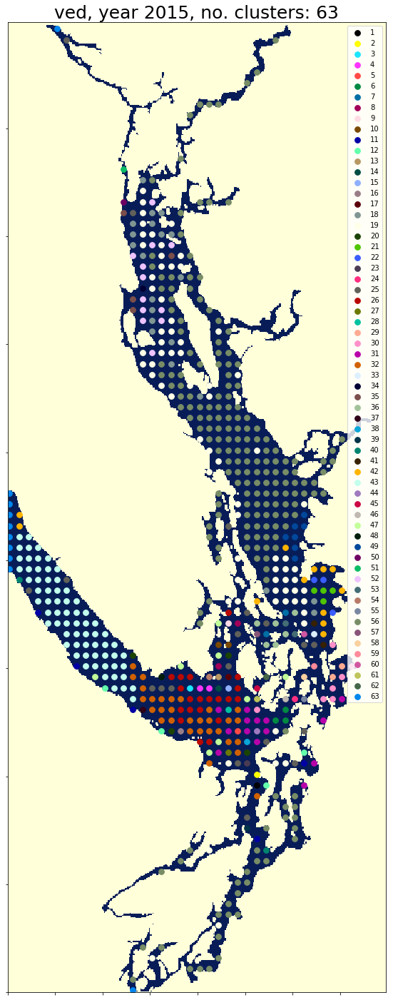

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0
61
#BEC459
62
#456648
63
#0086ED
64
#886F4C


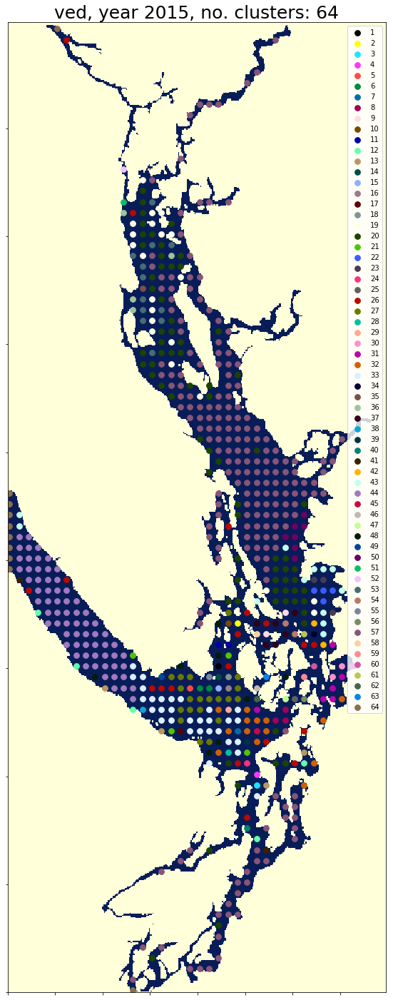

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0
61
#BEC459
62
#456648
63
#0086ED
64
#886F4C
65
#34362D


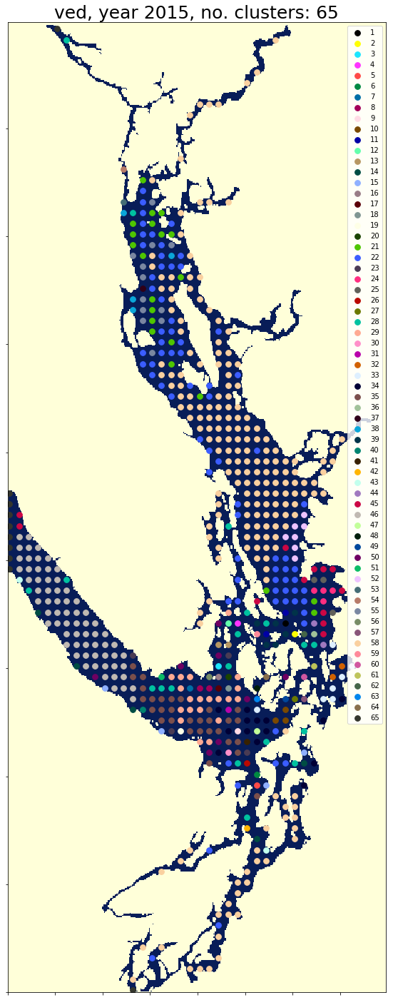

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0
61
#BEC459
62
#456648
63
#0086ED
64
#886F4C
65
#34362D
66
#B4A8BD


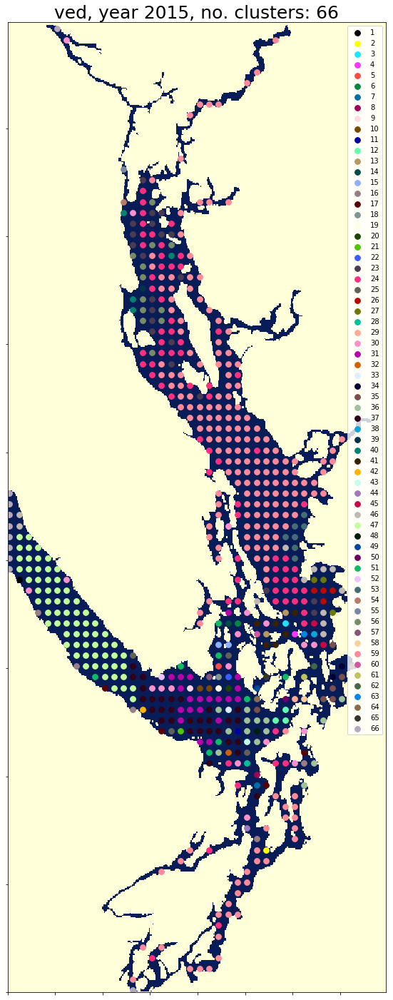

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0
61
#BEC459
62
#456648
63
#0086ED
64
#886F4C
65
#34362D
66
#B4A8BD
67
#00A6AA


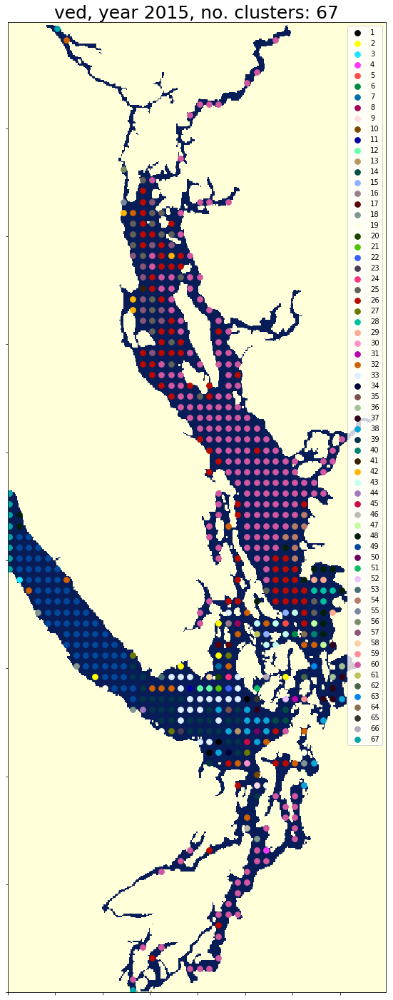

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0
61
#BEC459
62
#456648
63
#0086ED
64
#886F4C
65
#34362D
66
#B4A8BD
67
#00A6AA
68
#452C2C


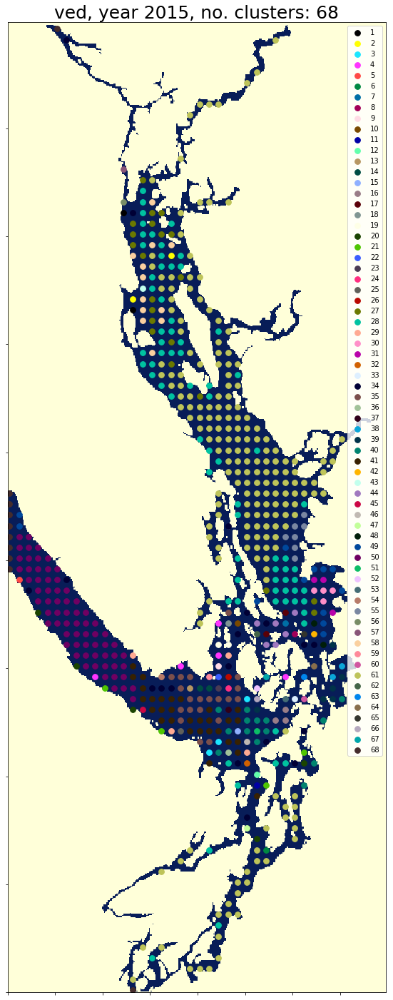

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0
61
#BEC459
62
#456648
63
#0086ED
64
#886F4C
65
#34362D
66
#B4A8BD
67
#00A6AA
68
#452C2C
69
#636375


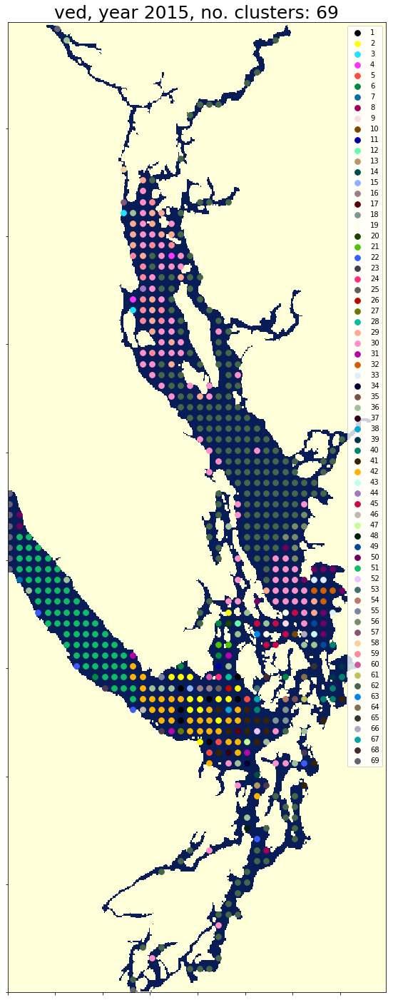

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0
61
#BEC459
62
#456648
63
#0086ED
64
#886F4C
65
#34362D
66
#B4A8BD
67
#00A6AA
68
#452C2C
69
#636375
70
#A3C8C9


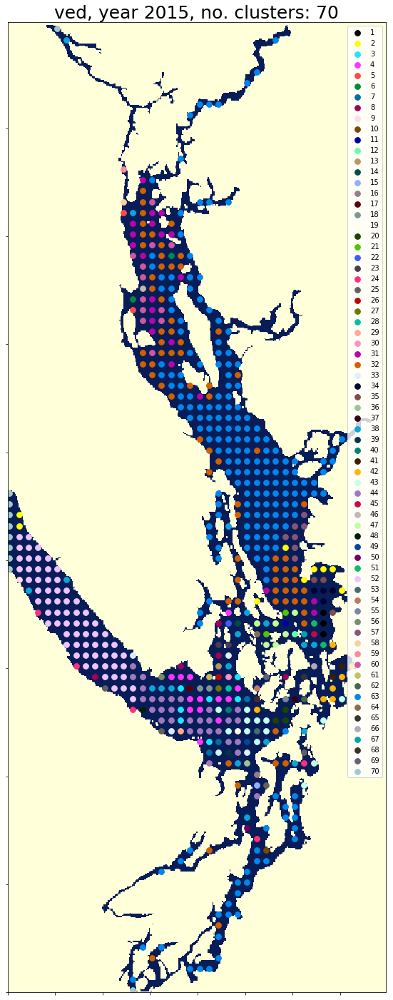

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0
61
#BEC459
62
#456648
63
#0086ED
64
#886F4C
65
#34362D
66
#B4A8BD
67
#00A6AA
68
#452C2C
69
#636375
70
#A3C8C9
71
#FF913F


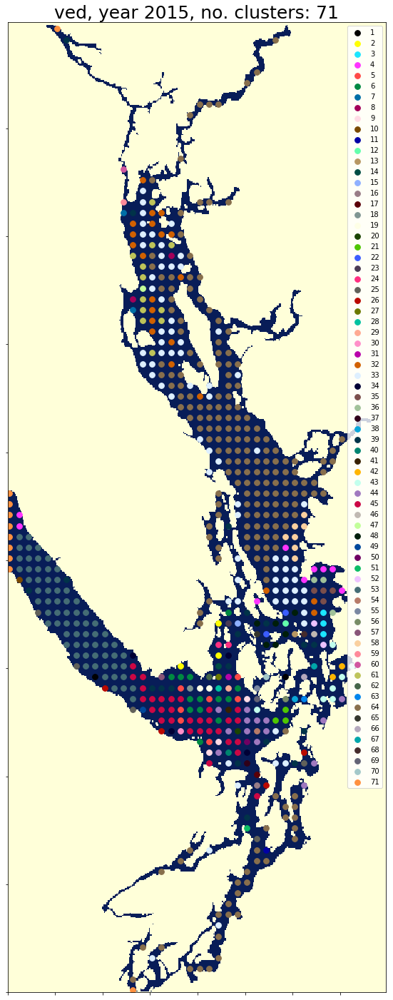

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0
61
#BEC459
62
#456648
63
#0086ED
64
#886F4C
65
#34362D
66
#B4A8BD
67
#00A6AA
68
#452C2C
69
#636375
70
#A3C8C9
71
#FF913F
72
#938A81


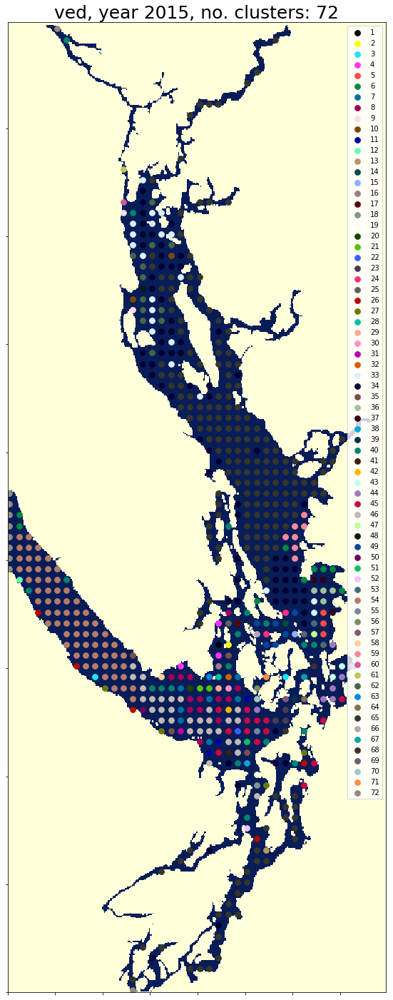

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0
61
#BEC459
62
#456648
63
#0086ED
64
#886F4C
65
#34362D
66
#B4A8BD
67
#00A6AA
68
#452C2C
69
#636375
70
#A3C8C9
71
#FF913F
72
#938A81
73
#575329


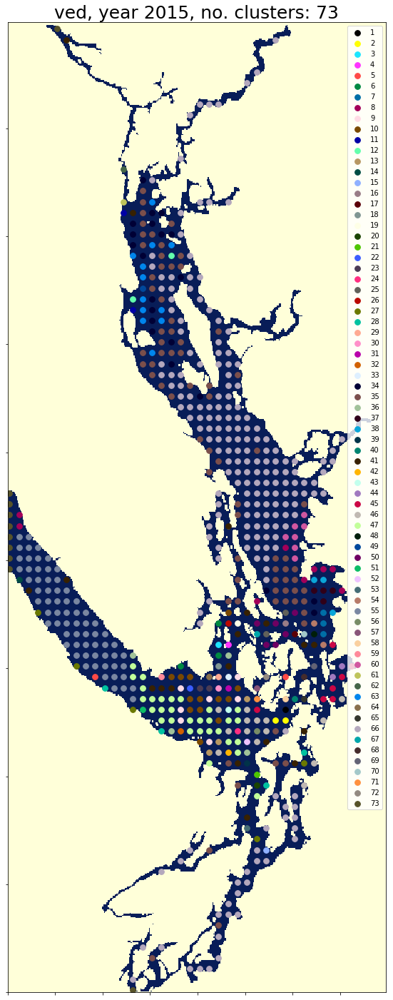

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0
61
#BEC459
62
#456648
63
#0086ED
64
#886F4C
65
#34362D
66
#B4A8BD
67
#00A6AA
68
#452C2C
69
#636375
70
#A3C8C9
71
#FF913F
72
#938A81
73
#575329
74
#00FECF


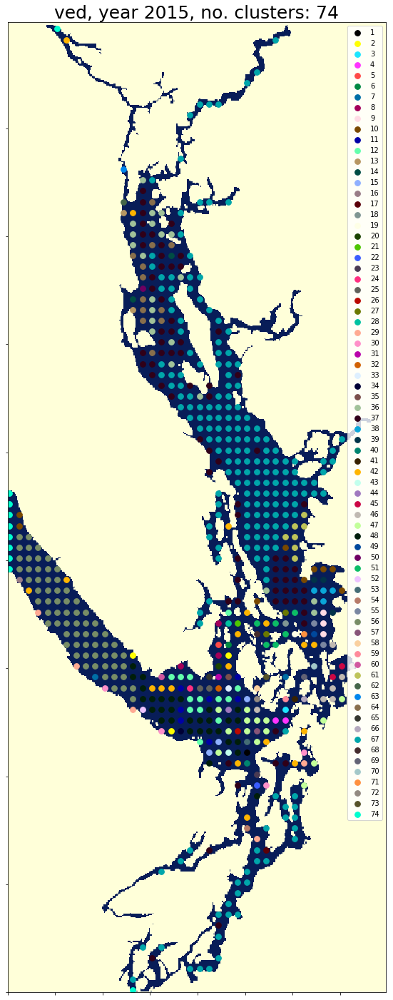

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0
61
#BEC459
62
#456648
63
#0086ED
64
#886F4C
65
#34362D
66
#B4A8BD
67
#00A6AA
68
#452C2C
69
#636375
70
#A3C8C9
71
#FF913F
72
#938A81
73
#575329
74
#00FECF
75
#B05B6F


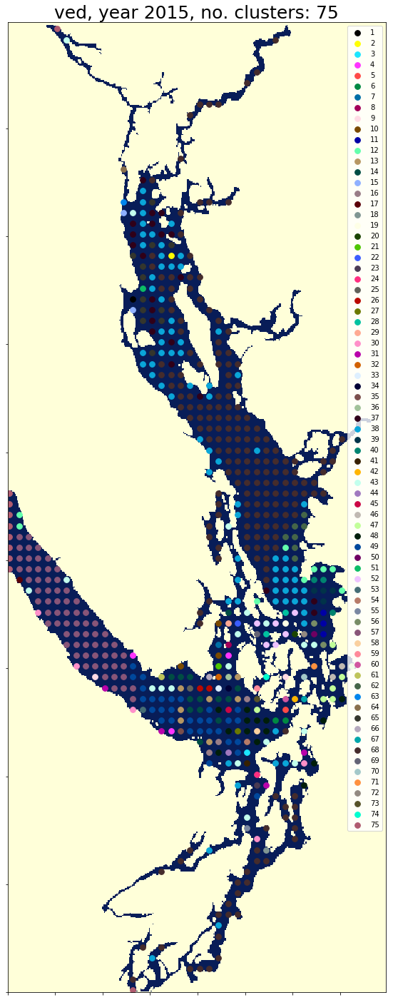

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0
61
#BEC459
62
#456648
63
#0086ED
64
#886F4C
65
#34362D
66
#B4A8BD
67
#00A6AA
68
#452C2C
69
#636375
70
#A3C8C9
71
#FF913F
72
#938A81
73
#575329
74
#00FECF
75
#B05B6F
76
#8CD0FF


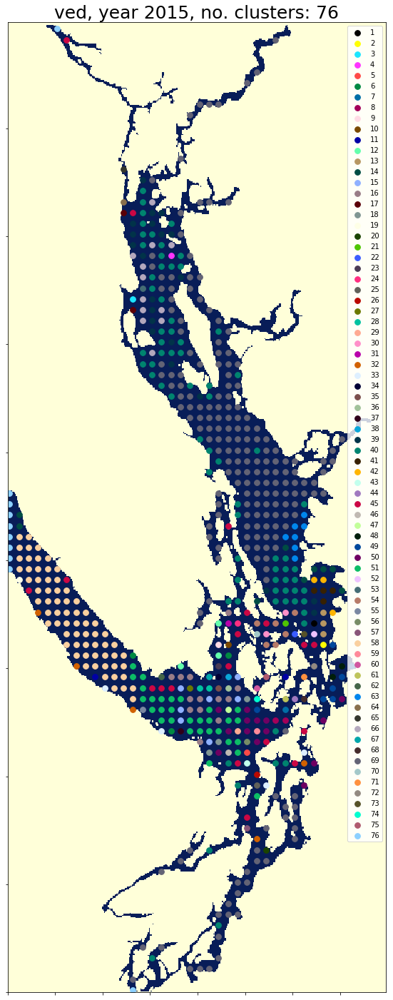

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0
61
#BEC459
62
#456648
63
#0086ED
64
#886F4C
65
#34362D
66
#B4A8BD
67
#00A6AA
68
#452C2C
69
#636375
70
#A3C8C9
71
#FF913F
72
#938A81
73
#575329
74
#00FECF
75
#B05B6F
76
#8CD0FF
77
#3B9700


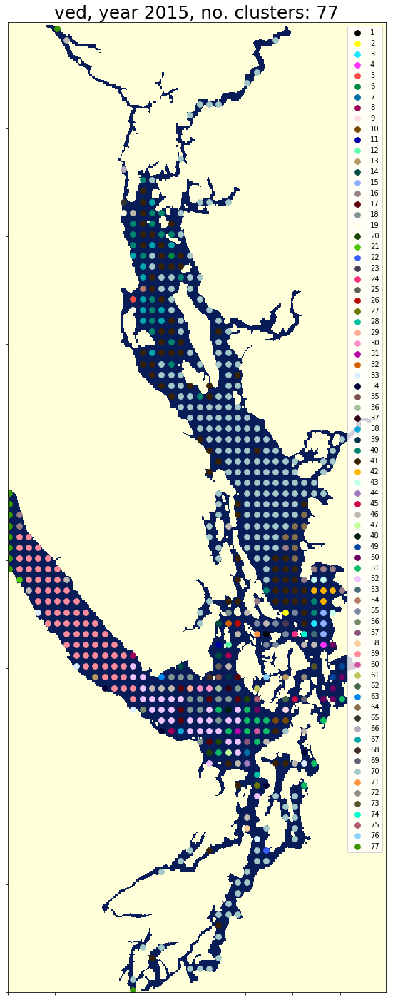

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0
61
#BEC459
62
#456648
63
#0086ED
64
#886F4C
65
#34362D
66
#B4A8BD
67
#00A6AA
68
#452C2C
69
#636375
70
#A3C8C9
71
#FF913F
72
#938A81
73
#575329
74
#00FECF
75
#B05B6F
76
#8CD0FF
77
#3B9700
78
#04F757


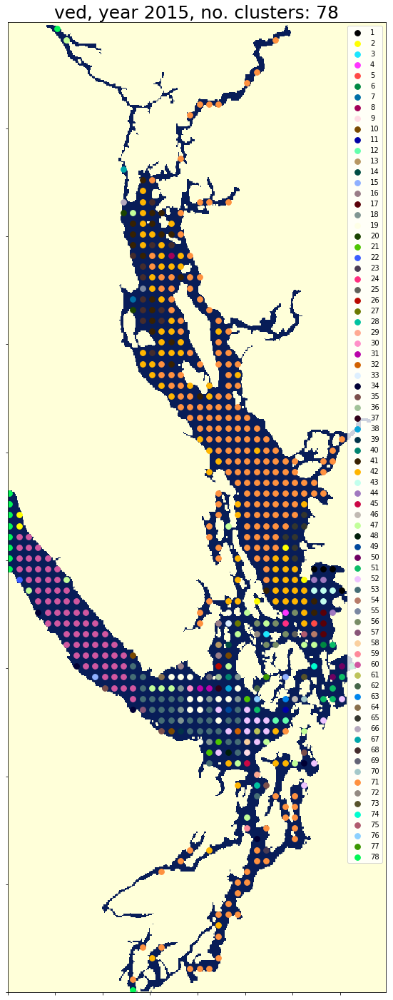

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0
61
#BEC459
62
#456648
63
#0086ED
64
#886F4C
65
#34362D
66
#B4A8BD
67
#00A6AA
68
#452C2C
69
#636375
70
#A3C8C9
71
#FF913F
72
#938A81
73
#575329
74
#00FECF
75
#B05B6F
76
#8CD0FF
77
#3B9700
78
#04F757
79
#C8A1A1


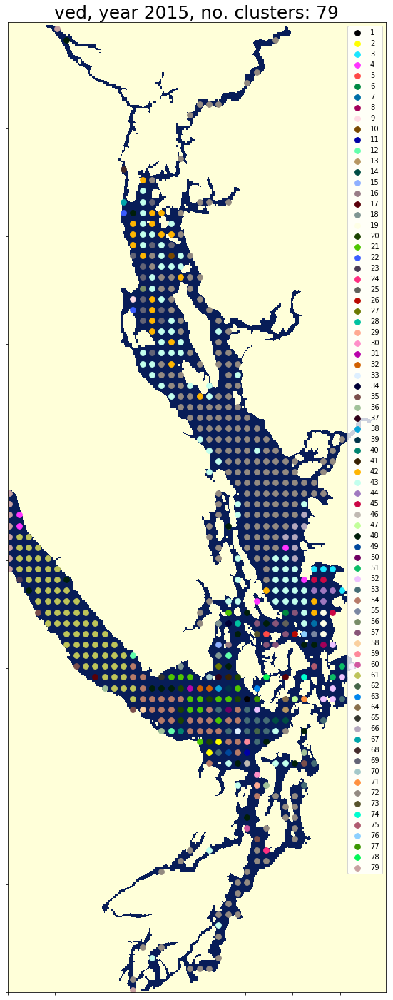

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0
61
#BEC459
62
#456648
63
#0086ED
64
#886F4C
65
#34362D
66
#B4A8BD
67
#00A6AA
68
#452C2C
69
#636375
70
#A3C8C9
71
#FF913F
72
#938A81
73
#575329
74
#00FECF
75
#B05B6F
76
#8CD0FF
77
#3B9700
78
#04F757
79
#C8A1A1
80
#1E6E00


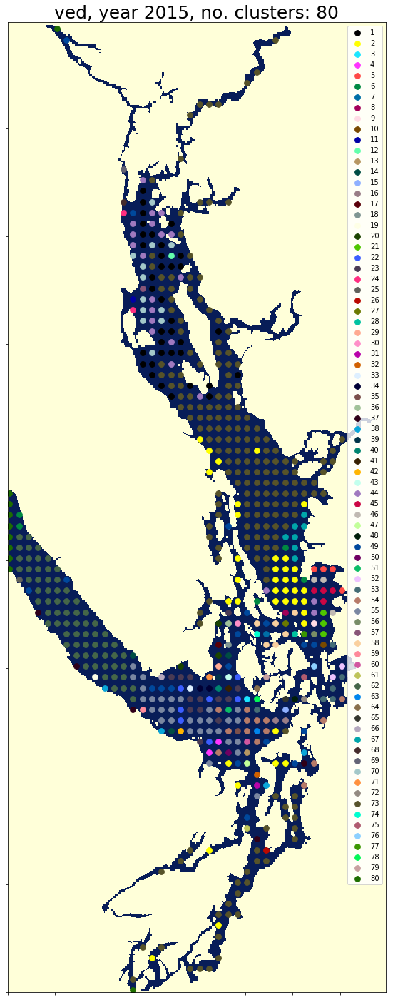

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0
61
#BEC459
62
#456648
63
#0086ED
64
#886F4C
65
#34362D
66
#B4A8BD
67
#00A6AA
68
#452C2C
69
#636375
70
#A3C8C9
71
#FF913F
72
#938A81
73
#575329
74
#00FECF
75
#B05B6F
76
#8CD0FF
77
#3B9700
78
#04F757
79
#C8A1A1
80
#1E6E00
81
#7900D7


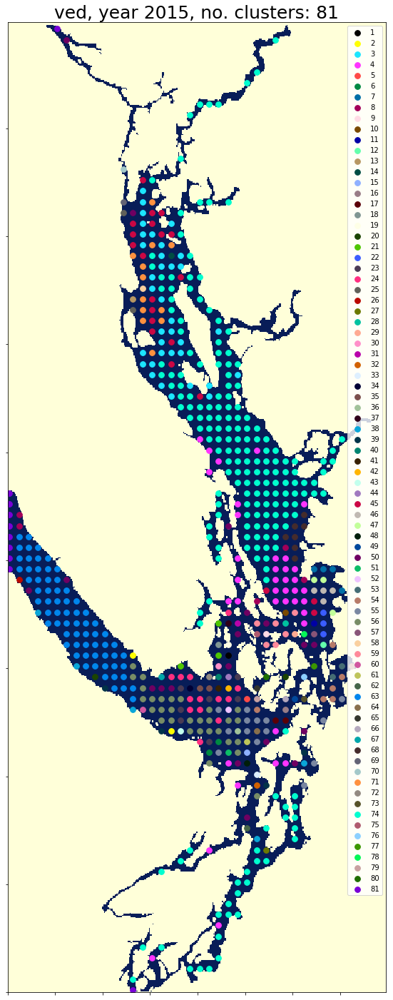

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0
61
#BEC459
62
#456648
63
#0086ED
64
#886F4C
65
#34362D
66
#B4A8BD
67
#00A6AA
68
#452C2C
69
#636375
70
#A3C8C9
71
#FF913F
72
#938A81
73
#575329
74
#00FECF
75
#B05B6F
76
#8CD0FF
77
#3B9700
78
#04F757
79
#C8A1A1
80
#1E6E00
81
#7900D7
82
#A77500


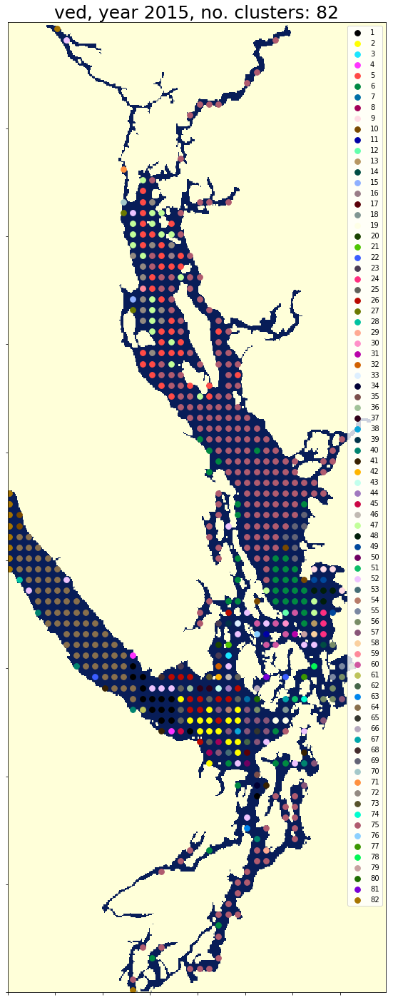

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0
61
#BEC459
62
#456648
63
#0086ED
64
#886F4C
65
#34362D
66
#B4A8BD
67
#00A6AA
68
#452C2C
69
#636375
70
#A3C8C9
71
#FF913F
72
#938A81
73
#575329
74
#00FECF
75
#B05B6F
76
#8CD0FF
77
#3B9700
78
#04F757
79
#C8A1A1
80
#1E6E00
81
#7900D7
82
#A77500
83
#6367A9


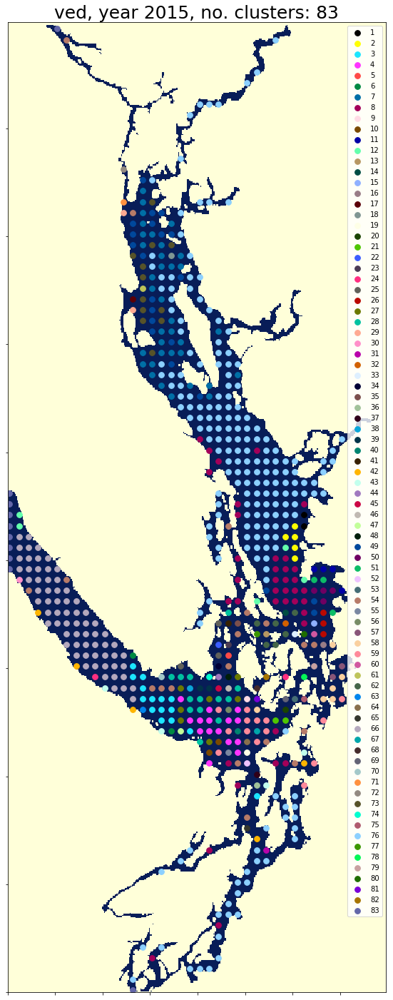

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0
61
#BEC459
62
#456648
63
#0086ED
64
#886F4C
65
#34362D
66
#B4A8BD
67
#00A6AA
68
#452C2C
69
#636375
70
#A3C8C9
71
#FF913F
72
#938A81
73
#575329
74
#00FECF
75
#B05B6F
76
#8CD0FF
77
#3B9700
78
#04F757
79
#C8A1A1
80
#1E6E00
81
#7900D7
82
#A77500
83
#6367A9
84
#A05837


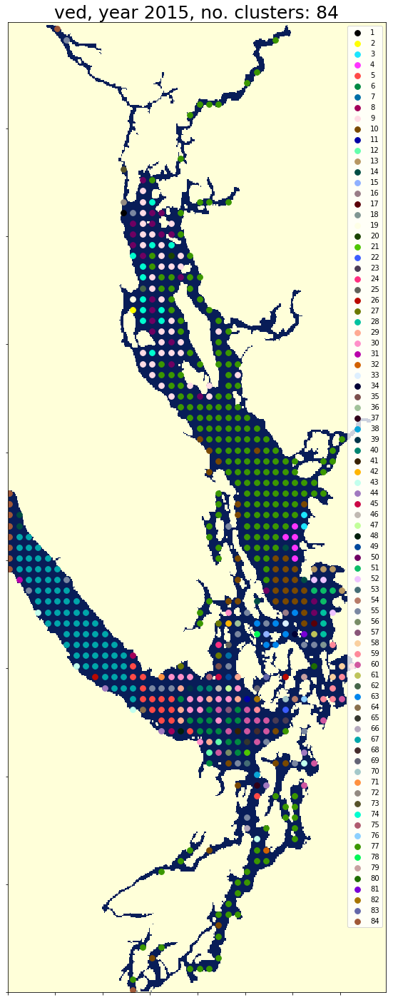

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0
61
#BEC459
62
#456648
63
#0086ED
64
#886F4C
65
#34362D
66
#B4A8BD
67
#00A6AA
68
#452C2C
69
#636375
70
#A3C8C9
71
#FF913F
72
#938A81
73
#575329
74
#00FECF
75
#B05B6F
76
#8CD0FF
77
#3B9700
78
#04F757
79
#C8A1A1
80
#1E6E00
81
#7900D7
82
#A77500
83
#6367A9
84
#A05837
85
#6B002C


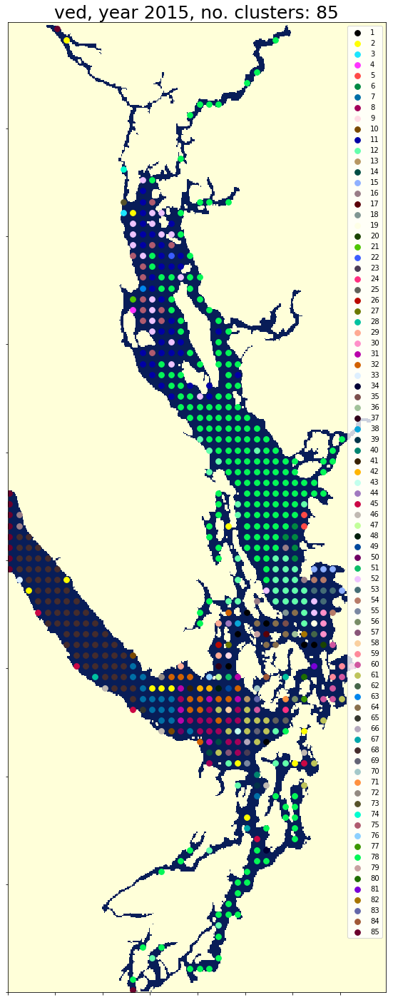

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0
61
#BEC459
62
#456648
63
#0086ED
64
#886F4C
65
#34362D
66
#B4A8BD
67
#00A6AA
68
#452C2C
69
#636375
70
#A3C8C9
71
#FF913F
72
#938A81
73
#575329
74
#00FECF
75
#B05B6F
76
#8CD0FF
77
#3B9700
78
#04F757
79
#C8A1A1
80
#1E6E00
81
#7900D7
82
#A77500
83
#6367A9
84
#A05837
85
#6B002C
86
#772600


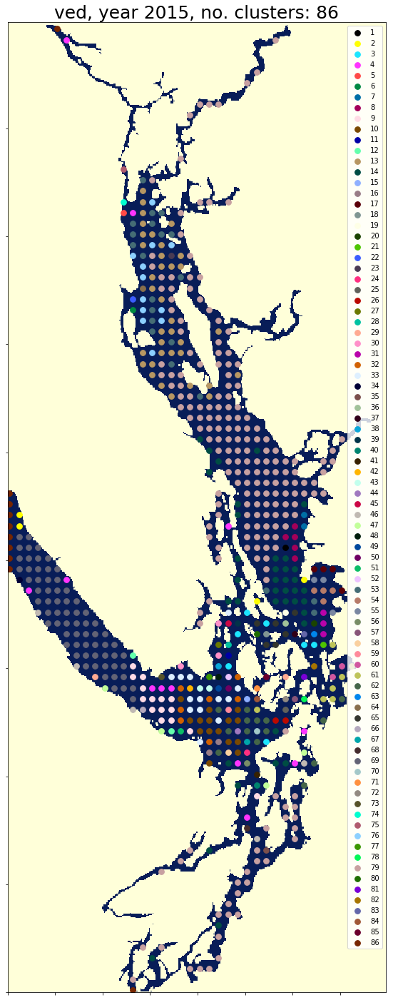

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0
61
#BEC459
62
#456648
63
#0086ED
64
#886F4C
65
#34362D
66
#B4A8BD
67
#00A6AA
68
#452C2C
69
#636375
70
#A3C8C9
71
#FF913F
72
#938A81
73
#575329
74
#00FECF
75
#B05B6F
76
#8CD0FF
77
#3B9700
78
#04F757
79
#C8A1A1
80
#1E6E00
81
#7900D7
82
#A77500
83
#6367A9
84
#A05837
85
#6B002C
86
#772600
87
#D790FF


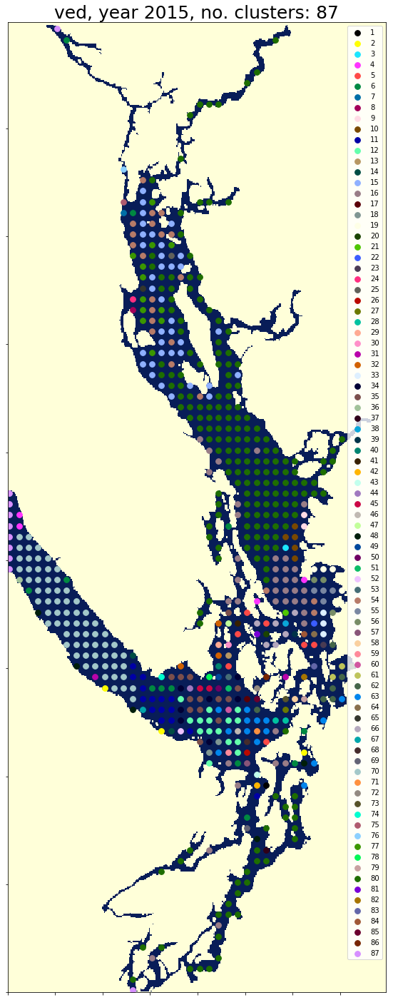

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0
61
#BEC459
62
#456648
63
#0086ED
64
#886F4C
65
#34362D
66
#B4A8BD
67
#00A6AA
68
#452C2C
69
#636375
70
#A3C8C9
71
#FF913F
72
#938A81
73
#575329
74
#00FECF
75
#B05B6F
76
#8CD0FF
77
#3B9700
78
#04F757
79
#C8A1A1
80
#1E6E00
81
#7900D7
82
#A77500
83
#6367A9
84
#A05837
85
#6B002C
86
#772600
87
#D790FF
88
#9B9700


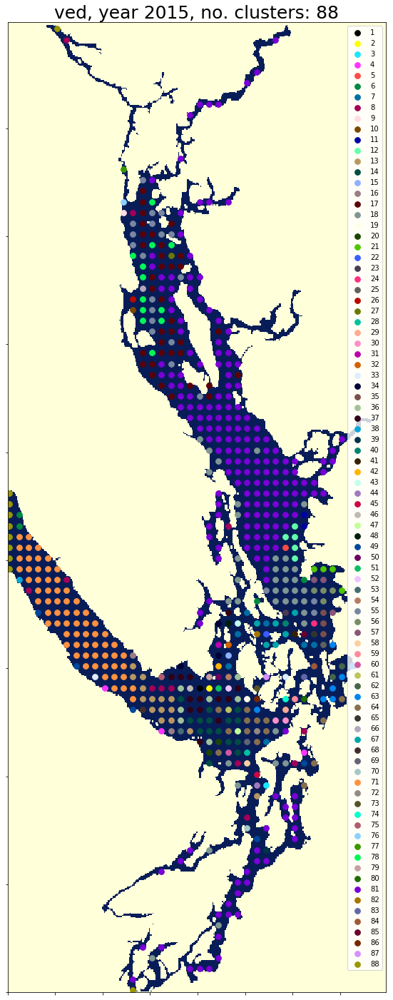

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0
61
#BEC459
62
#456648
63
#0086ED
64
#886F4C
65
#34362D
66
#B4A8BD
67
#00A6AA
68
#452C2C
69
#636375
70
#A3C8C9
71
#FF913F
72
#938A81
73
#575329
74
#00FECF
75
#B05B6F
76
#8CD0FF
77
#3B9700
78
#04F757
79
#C8A1A1
80
#1E6E00
81
#7900D7
82
#A77500
83
#6367A9
84
#A05837
85
#6B002C
86
#772600
87
#D790FF
88
#9B9700
89
#549E79


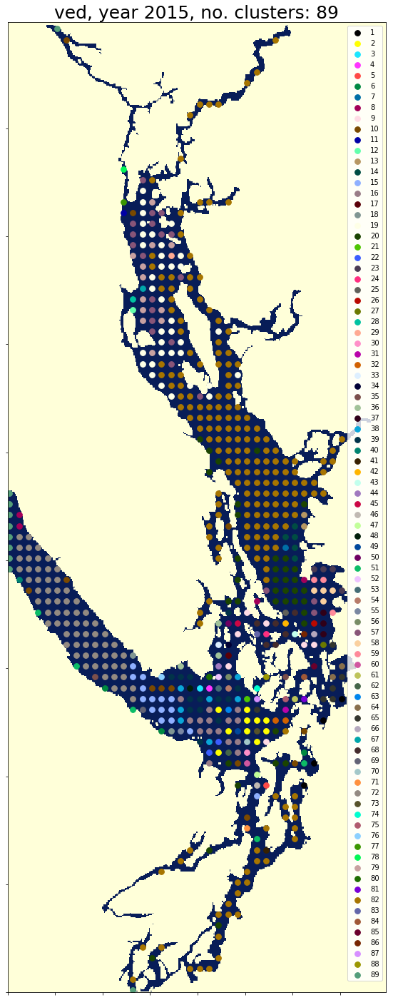

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0
61
#BEC459
62
#456648
63
#0086ED
64
#886F4C
65
#34362D
66
#B4A8BD
67
#00A6AA
68
#452C2C
69
#636375
70
#A3C8C9
71
#FF913F
72
#938A81
73
#575329
74
#00FECF
75
#B05B6F
76
#8CD0FF
77
#3B9700
78
#04F757
79
#C8A1A1
80
#1E6E00
81
#7900D7
82
#A77500
83
#6367A9
84
#A05837
85
#6B002C
86
#772600
87
#D790FF
88
#9B9700
89
#549E79
90
#FFF69F


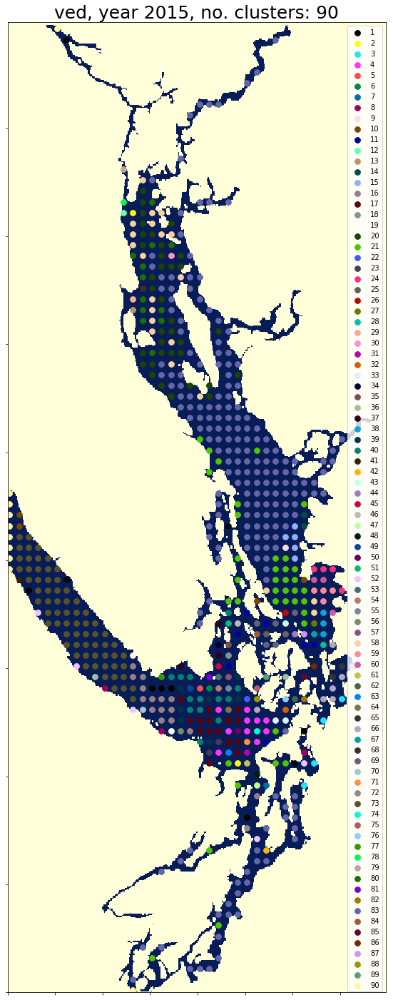

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0
61
#BEC459
62
#456648
63
#0086ED
64
#886F4C
65
#34362D
66
#B4A8BD
67
#00A6AA
68
#452C2C
69
#636375
70
#A3C8C9
71
#FF913F
72
#938A81
73
#575329
74
#00FECF
75
#B05B6F
76
#8CD0FF
77
#3B9700
78
#04F757
79
#C8A1A1
80
#1E6E00
81
#7900D7
82
#A77500
83
#6367A9
84
#A05837
85
#6B002C
86
#772600
87
#D790FF
88
#9B9700
89
#549E79
90
#FFF69F
91
#201625


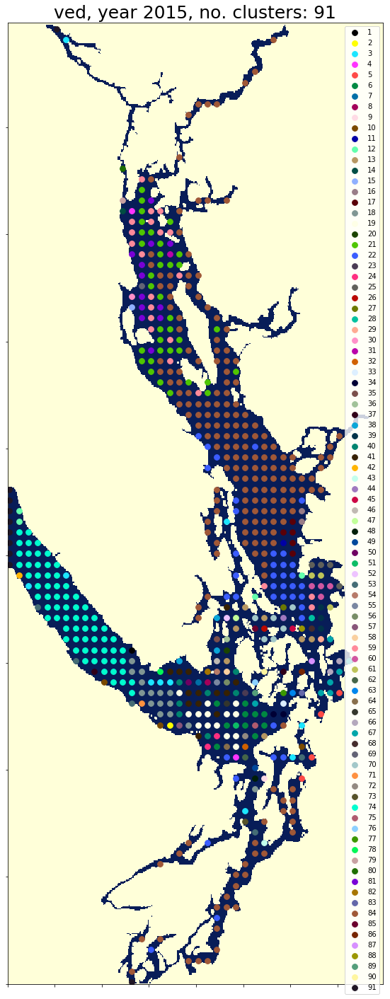

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0
61
#BEC459
62
#456648
63
#0086ED
64
#886F4C
65
#34362D
66
#B4A8BD
67
#00A6AA
68
#452C2C
69
#636375
70
#A3C8C9
71
#FF913F
72
#938A81
73
#575329
74
#00FECF
75
#B05B6F
76
#8CD0FF
77
#3B9700
78
#04F757
79
#C8A1A1
80
#1E6E00
81
#7900D7
82
#A77500
83
#6367A9
84
#A05837
85
#6B002C
86
#772600
87
#D790FF
88
#9B9700
89
#549E79
90
#FFF69F
91
#201625
92
#7241

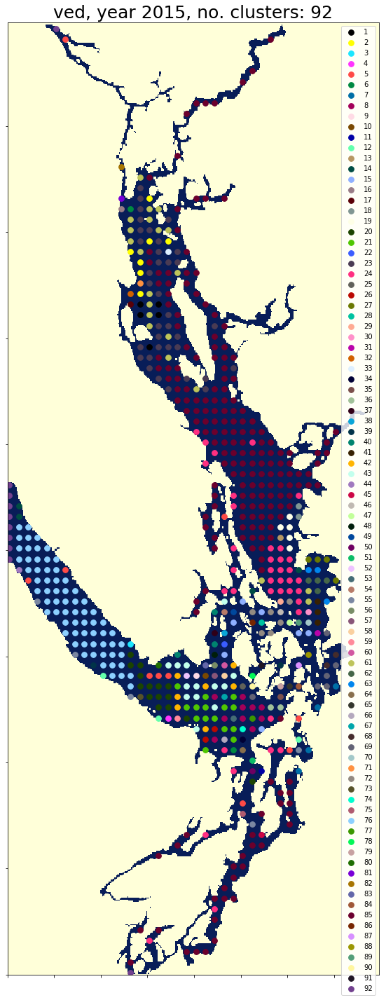

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0
61
#BEC459
62
#456648
63
#0086ED
64
#886F4C
65
#34362D
66
#B4A8BD
67
#00A6AA
68
#452C2C
69
#636375
70
#A3C8C9
71
#FF913F
72
#938A81
73
#575329
74
#00FECF
75
#B05B6F
76
#8CD0FF
77
#3B9700
78
#04F757
79
#C8A1A1
80
#1E6E00
81
#7900D7
82
#A77500
83
#6367A9
84
#A05837
85
#6B002C
86
#772600
87
#D790FF
88
#9B9700
89
#549E79
90
#FFF69F
91
#201625
92
#7241

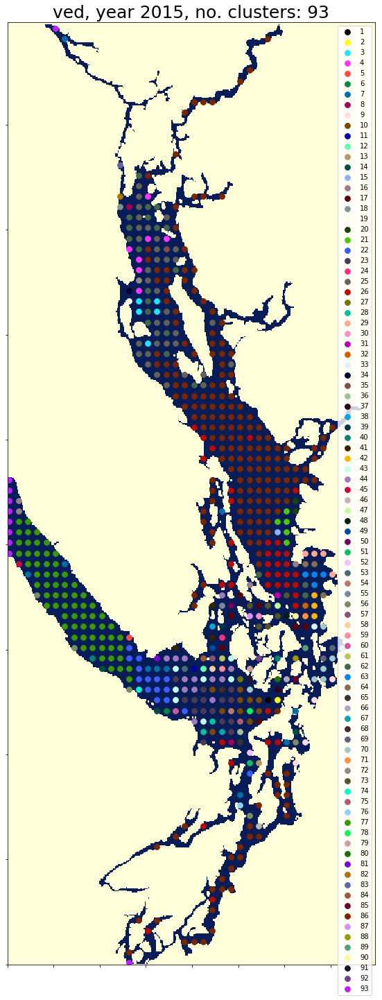

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0
61
#BEC459
62
#456648
63
#0086ED
64
#886F4C
65
#34362D
66
#B4A8BD
67
#00A6AA
68
#452C2C
69
#636375
70
#A3C8C9
71
#FF913F
72
#938A81
73
#575329
74
#00FECF
75
#B05B6F
76
#8CD0FF
77
#3B9700
78
#04F757
79
#C8A1A1
80
#1E6E00
81
#7900D7
82
#A77500
83
#6367A9
84
#A05837
85
#6B002C
86
#772600
87
#D790FF
88
#9B9700
89
#549E79
90
#FFF69F
91
#201625
92
#7241

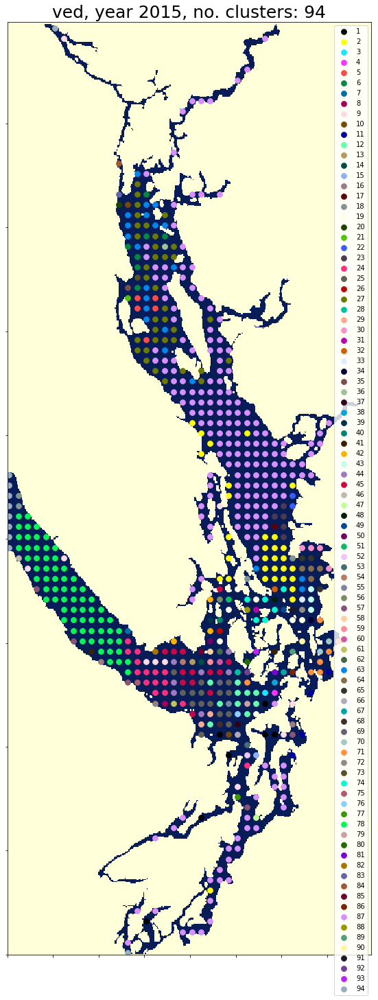

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0
61
#BEC459
62
#456648
63
#0086ED
64
#886F4C
65
#34362D
66
#B4A8BD
67
#00A6AA
68
#452C2C
69
#636375
70
#A3C8C9
71
#FF913F
72
#938A81
73
#575329
74
#00FECF
75
#B05B6F
76
#8CD0FF
77
#3B9700
78
#04F757
79
#C8A1A1
80
#1E6E00
81
#7900D7
82
#A77500
83
#6367A9
84
#A05837
85
#6B002C
86
#772600
87
#D790FF
88
#9B9700
89
#549E79
90
#FFF69F
91
#201625
92
#7241

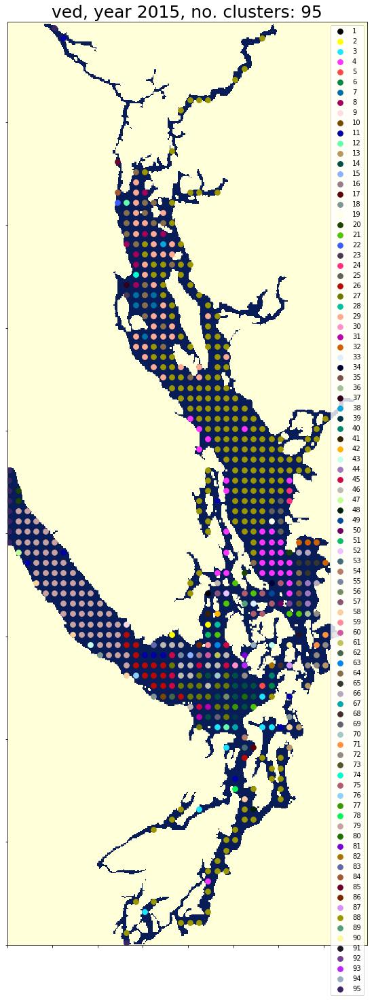

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0
61
#BEC459
62
#456648
63
#0086ED
64
#886F4C
65
#34362D
66
#B4A8BD
67
#00A6AA
68
#452C2C
69
#636375
70
#A3C8C9
71
#FF913F
72
#938A81
73
#575329
74
#00FECF
75
#B05B6F
76
#8CD0FF
77
#3B9700
78
#04F757
79
#C8A1A1
80
#1E6E00
81
#7900D7
82
#A77500
83
#6367A9
84
#A05837
85
#6B002C
86
#772600
87
#D790FF
88
#9B9700
89
#549E79
90
#FFF69F
91
#201625
92
#7241

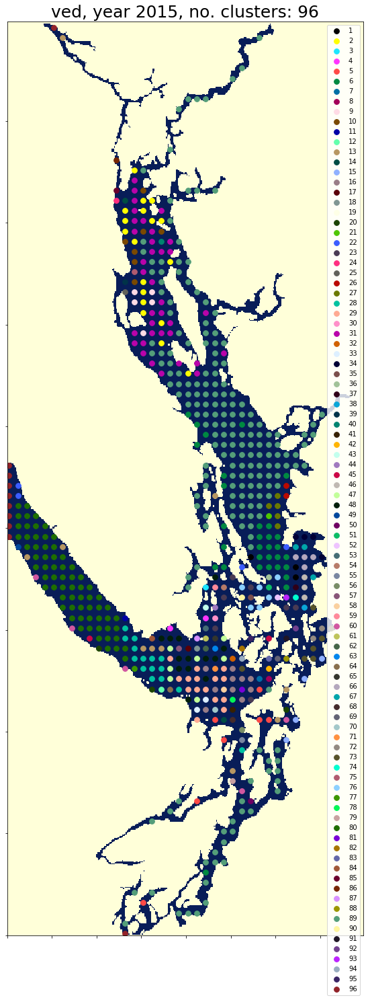

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0
61
#BEC459
62
#456648
63
#0086ED
64
#886F4C
65
#34362D
66
#B4A8BD
67
#00A6AA
68
#452C2C
69
#636375
70
#A3C8C9
71
#FF913F
72
#938A81
73
#575329
74
#00FECF
75
#B05B6F
76
#8CD0FF
77
#3B9700
78
#04F757
79
#C8A1A1
80
#1E6E00
81
#7900D7
82
#A77500
83
#6367A9
84
#A05837
85
#6B002C
86
#772600
87
#D790FF
88
#9B9700
89
#549E79
90
#FFF69F
91
#201625
92
#7241

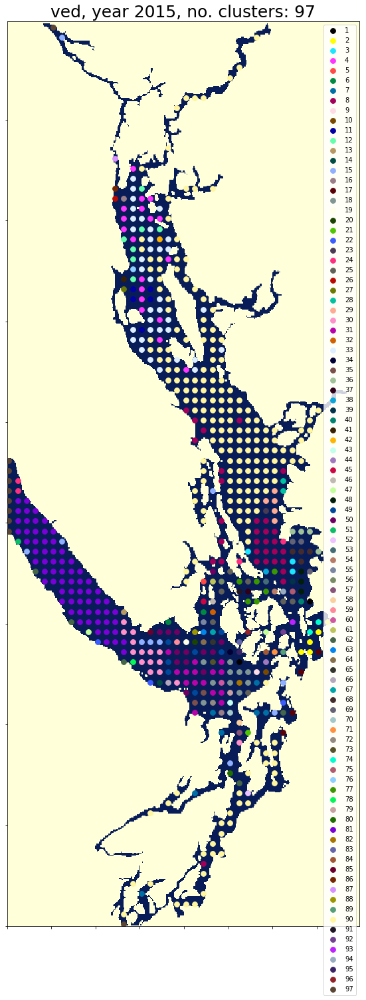

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0
61
#BEC459
62
#456648
63
#0086ED
64
#886F4C
65
#34362D
66
#B4A8BD
67
#00A6AA
68
#452C2C
69
#636375
70
#A3C8C9
71
#FF913F
72
#938A81
73
#575329
74
#00FECF
75
#B05B6F
76
#8CD0FF
77
#3B9700
78
#04F757
79
#C8A1A1
80
#1E6E00
81
#7900D7
82
#A77500
83
#6367A9
84
#A05837
85
#6B002C
86
#772600
87
#D790FF
88
#9B9700
89
#549E79
90
#FFF69F
91
#201625
92
#7241

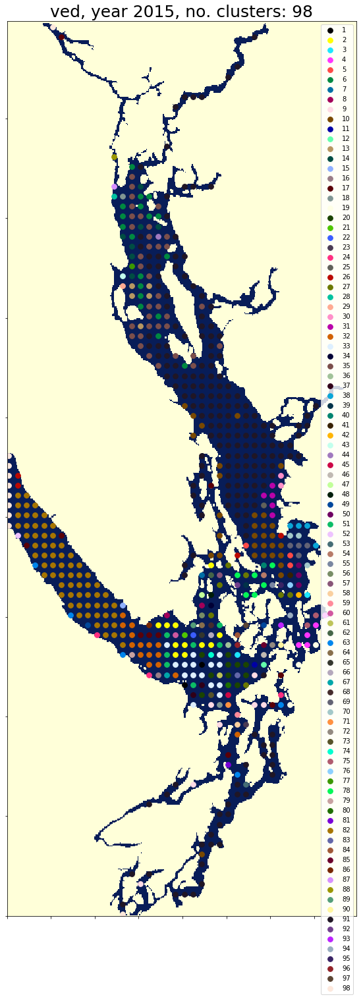

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0
61
#BEC459
62
#456648
63
#0086ED
64
#886F4C
65
#34362D
66
#B4A8BD
67
#00A6AA
68
#452C2C
69
#636375
70
#A3C8C9
71
#FF913F
72
#938A81
73
#575329
74
#00FECF
75
#B05B6F
76
#8CD0FF
77
#3B9700
78
#04F757
79
#C8A1A1
80
#1E6E00
81
#7900D7
82
#A77500
83
#6367A9
84
#A05837
85
#6B002C
86
#772600
87
#D790FF
88
#9B9700
89
#549E79
90
#FFF69F
91
#201625
92
#7241

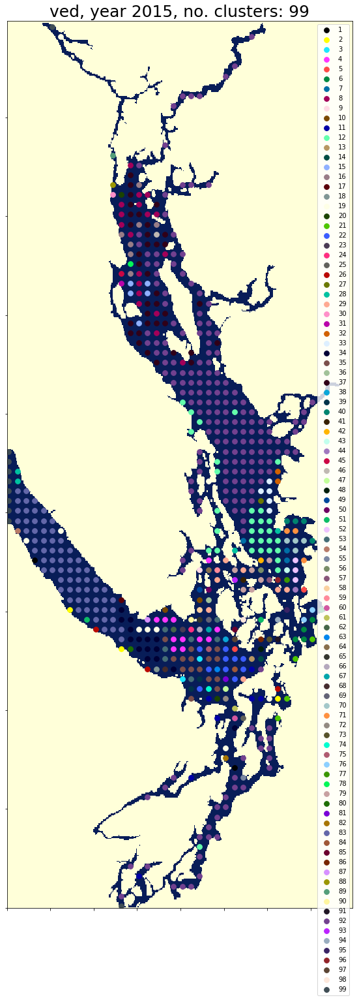

1
#000000
2
#FFFF00
3
#1CE6FF
4
#FF34FF
5
#FF4A46
6
#008941
7
#006FA6
8
#A30059
9
#FFDBE5
10
#7A4900
11
#0000A6
12
#63FFAC
13
#B79762
14
#004D43
15
#8FB0FF
16
#997D87
17
#5A0007
18
#809693
19
#FEFFE6
20
#1B4400
21
#4FC601
22
#3B5DFF
23
#4A3B53
24
#FF2F80
25
#61615A
26
#BA0900
27
#6B7900
28
#00C2A0
29
#FFAA92
30
#FF90C9
31
#B903AA
32
#D16100
33
#DDEFFF
34
#000035
35
#7B4F4B
36
#A1C299
37
#300018
38
#0AA6D8
39
#013349
40
#00846F
41
#372101
42
#FFB500
43
#C2FFED
44
#A079BF
45
#CC0744
46
#C0B9B2
47
#C2FF99
48
#001E09
49
#00489C
50
#6F0062
51
#0CBD66
52
#EEC3FF
53
#456D75
54
#B77B68
55
#7A87A1
56
#788D66
57
#885578
58
#FAD09F
59
#FF8A9A
60
#D157A0
61
#BEC459
62
#456648
63
#0086ED
64
#886F4C
65
#34362D
66
#B4A8BD
67
#00A6AA
68
#452C2C
69
#636375
70
#A3C8C9
71
#FF913F
72
#938A81
73
#575329
74
#00FECF
75
#B05B6F
76
#8CD0FF
77
#3B9700
78
#04F757
79
#C8A1A1
80
#1E6E00
81
#7900D7
82
#A77500
83
#6367A9
84
#A05837
85
#6B002C
86
#772600
87
#D790FF
88
#9B9700
89
#549E79
90
#FFF69F
91
#201625
92
#7241

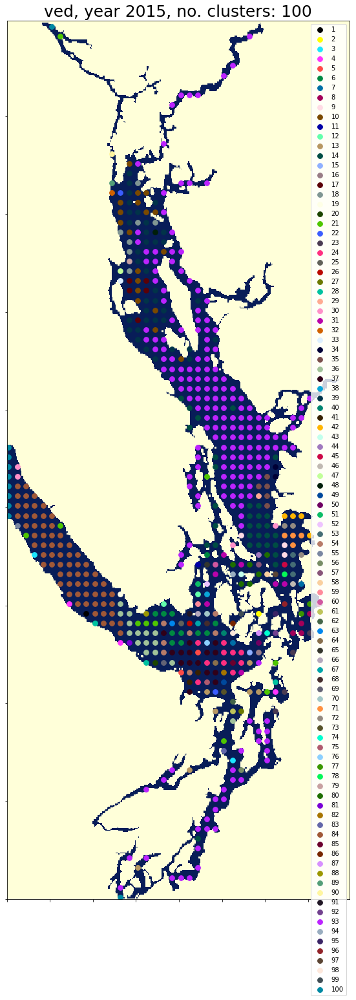

In [11]:
var = 'ved'
year = '2015'
fs = './clmats_n/' + var + '_' + year + 'hind_n_cl.mat'
#masked for ved
fs = './clmats_n/' + var + '_' + year + '_hind_n_cl_999MASK.mat'

n = 100

mat_contents = sio.loadmat(fs)
#print(mat_contents)

cl = np.squeeze((mat_contents['clusters']))
print(cl)
w = cl.shape
cl_2 = cl[1,:]
print(cl_2)
print(w)
    
for i in range(0,100):
    cln = i+1
    tit = var +', year ' + year +', no. clusters: ' +str(cln)
    
    cl_this = cl[i,:]
    markersize = 60
    titfontsize = 25
    legfontsize = 10
    fsx = 20
    fsy = 25
    fname = './figs/' + var + year + '_cl_' + str(cln) + 'map.jpg'

    cf.map_clusters(tit,cln,cl_this,fsx,fsy,markersize,titfontsize,legfontsize,fname,colors)

